In [ ]:
from google.colab import drive
import os
import pandas as pd
import glob

# Monta el drive para acceder a los archivos
drive.mount('/content/drive')

# Cambia a la carpeta donde están tus archivos CSV en el Drive
folder_path = '/content/drive/My Drive/DemandaEnergia'
os.chdir(folder_path)

Mounted at /content/drive


In [ ]:
# Cargar el archivo CSV 'df_final.csv' en un DataFrame
df_final = pd.read_csv('df_final.csv')

In [ ]:
df_final

,Fecha,AndaluciaEnergia,AragonEnergia,AsturiasEnergia,CantabriaEnergia,CastillaDeLaManchaEnergia,CastillaYLeonEnergia,CataluniaEnergia,CeutaEnergia,EspaniaEnergia,...,IslasBalearesDuracionDia,LaRiojaDuracionDia,MadridDuracionDia,MelillaDuracionDia,MurciaDuracionDia,NavarraDuracionDia,PaisVascoDuracionDia,ValenciaDuracionDia,Poblacion,PIB
0,01/2011,3611.370158,956.500295,1020.147744,394.458733,1151.079404,1308.023490,4342.582019,16.753994,24865.971404,...,43149.455484,44068.800323,44299.789355,44158.533548,43838.515484,43928.002258,44120.062581,43698.027097,1.555572e+07,"-0,1500"
1,01/2012,3603.907344,922.987660,963.039249,353.760208,1110.101866,1310.529090,4239.810333,18.519813,24314.612326,...,43148.543226,44069.856129,44301.338387,44159.780000,43839.079355,43928.757097,44121.227097,43698.290645,1.560607e+07,"-0,9313"
2,01/2013,3427.297594,898.060795,916.680371,381.780480,1064.945693,1261.244110,4219.945354,17.905936,23733.440188,...,43151.738387,44066.165806,44295.918065,44155.417742,43837.109032,43926.119677,44117.151290,43697.373548,1.557088e+07,"-0,3076"
3,01/2014,3406.748087,882.108476,926.940981,343.029447,1045.902927,1240.207395,4100.446945,18.805790,23201.370657,...,43150.633871,44067.439032,44297.790968,44156.924194,43837.790000,43927.030645,44118.559355,43697.688710,1.549858e+07,"0,3675"
4,01/2015,3485.428721,903.645512,956.258030,374.887914,1069.550840,1265.447012,4166.773739,18.698456,23850.778461,...,43149.631935,44068.596452,44299.489032,44158.292258,43838.406129,43927.857419,44119.836774,43697.977097,1.547524e+07,"1,1476"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,12/2019,3383.670228,875.169733,770.472528,324.383453,1010.042555,1205.933214,3858.858012,17.711219,22110.920732,...,43097.650000,44129.385806,44388.579677,44230.075806,43870.974839,43971.393871,44186.908387,43713.319677,1.569593e+07,"0,2171"
160,12/2020,3482.080542,873.158298,812.041784,306.515675,1018.731820,1205.269286,3983.099447,17.053994,22438.961596,...,43096.991290,44130.167419,44389.720000,44230.997097,43871.393226,43971.952903,44187.768065,43713.520968,1.578162e+07,"0,2411"
161,12/2021,3441.074577,895.918585,805.235909,314.925718,1048.655126,1192.721645,3796.545717,16.848583,22029.944637,...,43097.175484,44129.950323,44389.401290,44230.739032,43871.277097,43971.796774,44187.527419,43713.463871,1.580820e+07,"1,9888"
162,12/2022,3127.215411,828.154912,741.601993,276.394369,956.420809,1103.692928,3660.750488,15.734913,20287.656712,...,43097.337097,44129.758710,44389.120323,44230.513548,43871.172581,43971.660000,44187.316774,43713.415161,1.598010e+07,"0,4913"


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164 entries, 0 to 163
Data columns (total 80 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Fecha                             164 non-null    object 
 1   AndaluciaEnergia                  158 non-null    float64
 2   AragonEnergia                     158 non-null    float64
 3   AsturiasEnergia                   158 non-null    float64
 4   CantabriaEnergia                  157 non-null    float64
 5   CastillaDeLaManchaEnergia         157 non-null    float64
 6   CastillaYLeonEnergia              157 non-null    float64
 7   CataluniaEnergia                  158 non-null    float64
 8   CeutaEnergia                      162 non-null    float64
 9   EspaniaEnergia                    164 non-null    float64
 10  ExtremaduraEnergia                157 non-null    float64
 11  GaliciaEnergia                    157 non-null    float64
 12  IslasBal

In [ ]:
# Convertir la columna 'Fecha' a formato datetime
df_final['Fecha'] = pd.to_datetime(df_final['Fecha'], format='%m/%Y')

In [ ]:
import seaborn as sns

df_final['PIB'] = df_final['PIB'].str.replace('.', '', regex=False)  # Eliminar los puntos (separadores de miles)
df_final['PIB'] = df_final['PIB'].str.replace(',', '.', regex=False)  # Reemplazar comas por puntos (decimales)

# Convertir columnas a numéricas, si es necesario
df_final['PIB'] = pd.to_numeric(df_final['PIB'], errors='coerce')

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164 entries, 0 to 163
Data columns (total 80 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Fecha                             164 non-null    datetime64[ns]
 1   AndaluciaEnergia                  158 non-null    float64       
 2   AragonEnergia                     158 non-null    float64       
 3   AsturiasEnergia                   158 non-null    float64       
 4   CantabriaEnergia                  157 non-null    float64       
 5   CastillaDeLaManchaEnergia         157 non-null    float64       
 6   CastillaYLeonEnergia              157 non-null    float64       
 7   CataluniaEnergia                  158 non-null    float64       
 8   CeutaEnergia                      162 non-null    float64       
 9   EspaniaEnergia                    164 non-null    float64       
 10  ExtremaduraEnergia                157 non-null    

In [ ]:
# Primero, ordenar las fechas
df_final = df_final.sort_values(by='Fecha')


## Analisis columnas energía

### Caja y bigotes

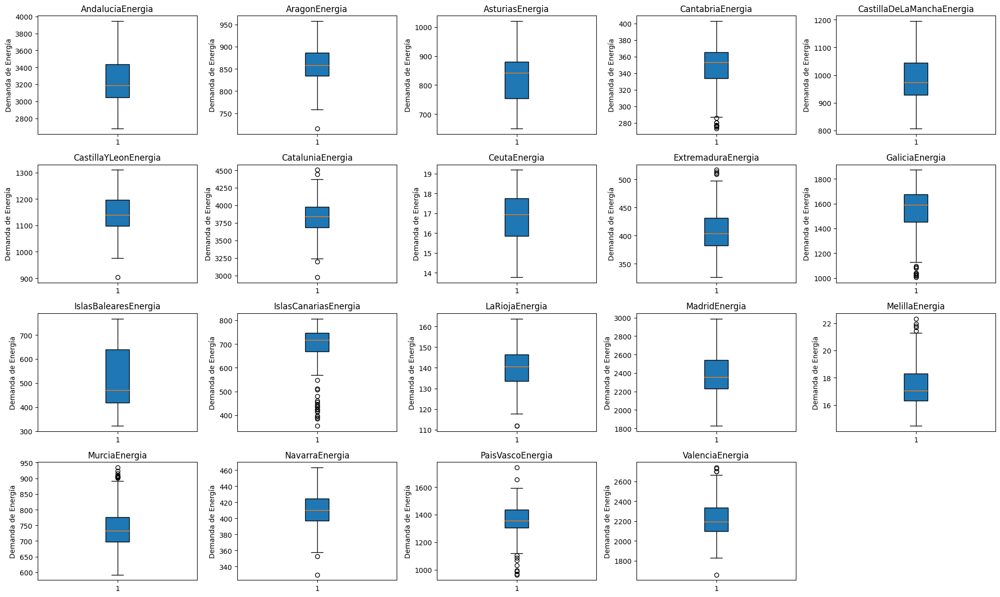

In [ ]:
import matplotlib.pyplot as plt

# Filtrar las columnas de energía, excluyendo 'EspaniaEnergia'
energia_cols = [col for col in df_final.columns if 'Energia' in col and 'Espania' not in col]

# Crear un gráfico boxplot por cada comunidad de energía
fig, axs = plt.subplots(len(energia_cols)//5 + 1, 5, figsize=(20, 12))  # Ajustar las dimensiones según el número de gráficos

# Aplanar la matriz de subplots
axs = axs.flatten()

for i, col in enumerate(energia_cols):
    # Crear un boxplot para cada comunidad
    axs[i].boxplot(df_final[col].dropna(), vert=True, patch_artist=True)
    axs[i].set_title(col)
    axs[i].set_ylabel('Demanda de Energía')

# Eliminar subplots vacíos si hay menos de len(energia_cols)//5 * 5
for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


### Gráficos de líneas

In [ ]:
import matplotlib.pyplot as plt

# Lista de todas las columnas de energía (excluyendo 'EspaniaEnergia')
energia_cols = [col for col in df_final.columns if 'Energia' in col and 'Espania' not in col]

# Iterar por cada columna de energía para generar los gráficos
for col in energia_cols:
    fig, ax = plt.subplots(2, 1, figsize=(10, 8))  # Crear dos subplots: uno para la línea y otro para el boxplot

    # Gráfico de líneas vs tiempo
    ax[0].plot(df_final['Fecha'], df_final[col], marker='o')
    ax[0].set_title(f'Gráfico de líneas vs Tiempo: {col}')
    ax[0].set_xlabel('Fecha')
    ax[0].set_ylabel('Demanda de Energía')
    ax[0].grid(True)

    # Gráfico boxplot
    ax[1].boxplot(df_final[col].dropna(), vert=True, patch_artist=True)
    ax[1].set_title(f'Boxplot: {col}')
    ax[1].set_ylabel('Demanda de Energía')

    # Ajustar la distribución de los gráficos
    plt.tight_layout()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Lista de todas las columnas de energía (excluyendo 'EspaniaEnergia')
energia_cols = [col for col in df_final.columns if 'Energia' in col and 'Espania' not in col]

# Crear un DataFrame vacío para almacenar los resultados
zeros_data = []

# Iterar sobre cada columna de energía
for col in energia_cols:
    # Filtrar las filas donde la demanda de energía es igual a 0
    zeros = df_final[df_final[col] == 0][['Fecha', col]]

    # Si se encuentran filas con valor 0, añadirlas al DataFrame
    if not zeros.empty:
        zeros['Comunidad'] = col
        zeros_data.append(zeros)

# Concatenar todos los resultados en un solo DataFrame
if zeros_data:
    df_zeros = pd.concat(zeros_data, ignore_index=True)
    print("Columnas de energía con datos en cero y sus fechas:")
    print(df_zeros)
else:
    print("No se encontraron valores en cero en ninguna columna de energía.")


No se encontraron valores en cero en ninguna columna de energía.


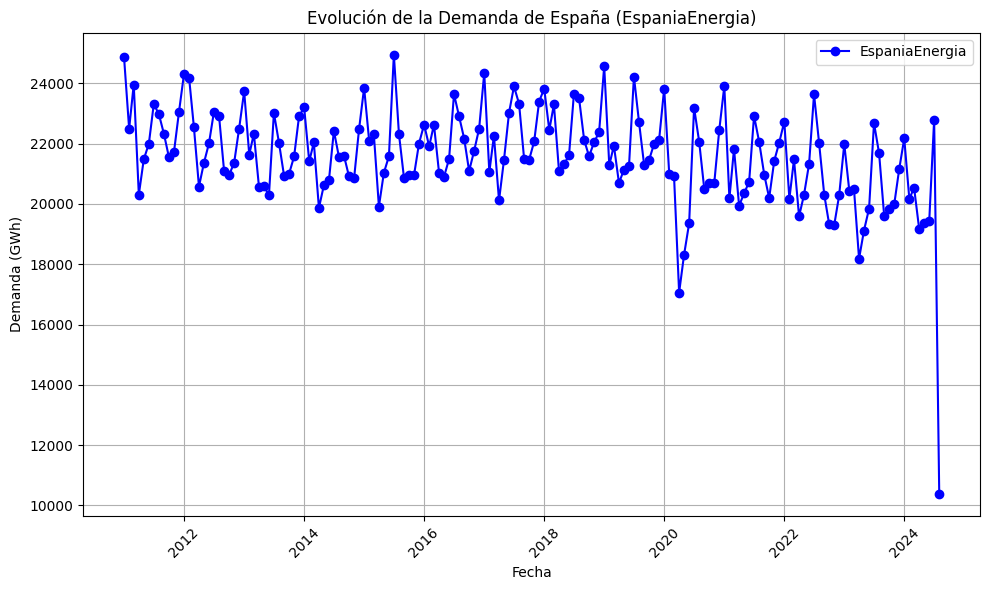

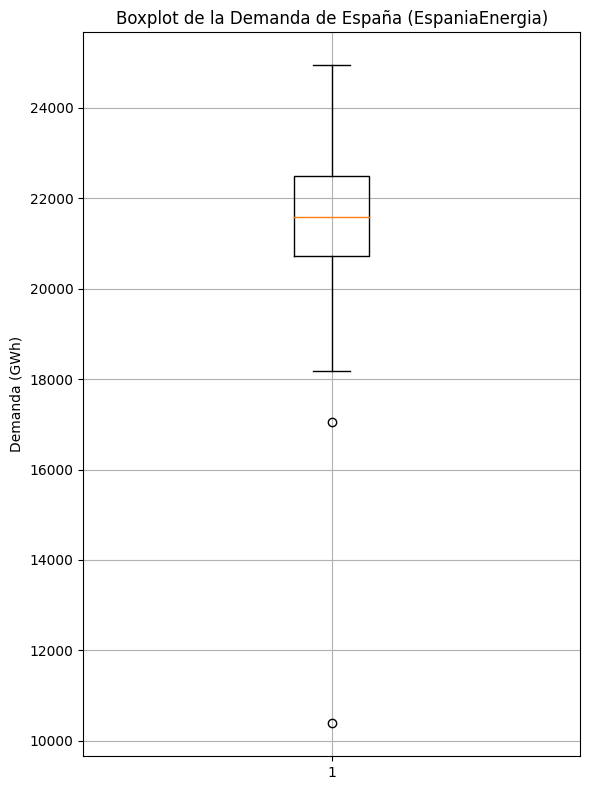

In [ ]:
import matplotlib.pyplot as plt

# Gráfico de líneas para 'EspaniaEnergia'
plt.figure(figsize=(10, 6))
plt.plot(df_final['Fecha'], df_final['EspaniaEnergia'], marker='o', linestyle='-', color='b', label='EspaniaEnergia')
plt.title('Evolución de la Demanda de España (EspaniaEnergia)')
plt.xlabel('Fecha')
plt.ylabel('Demanda (GWh)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Gráfico Boxplot para 'EspaniaEnergia'
plt.figure(figsize=(6, 8))
plt.boxplot(df_final['EspaniaEnergia'].dropna())
plt.title('Boxplot de la Demanda de España (EspaniaEnergia)')
plt.ylabel('Demanda (GWh)')
plt.grid(True)
plt.tight_layout()
plt.show()


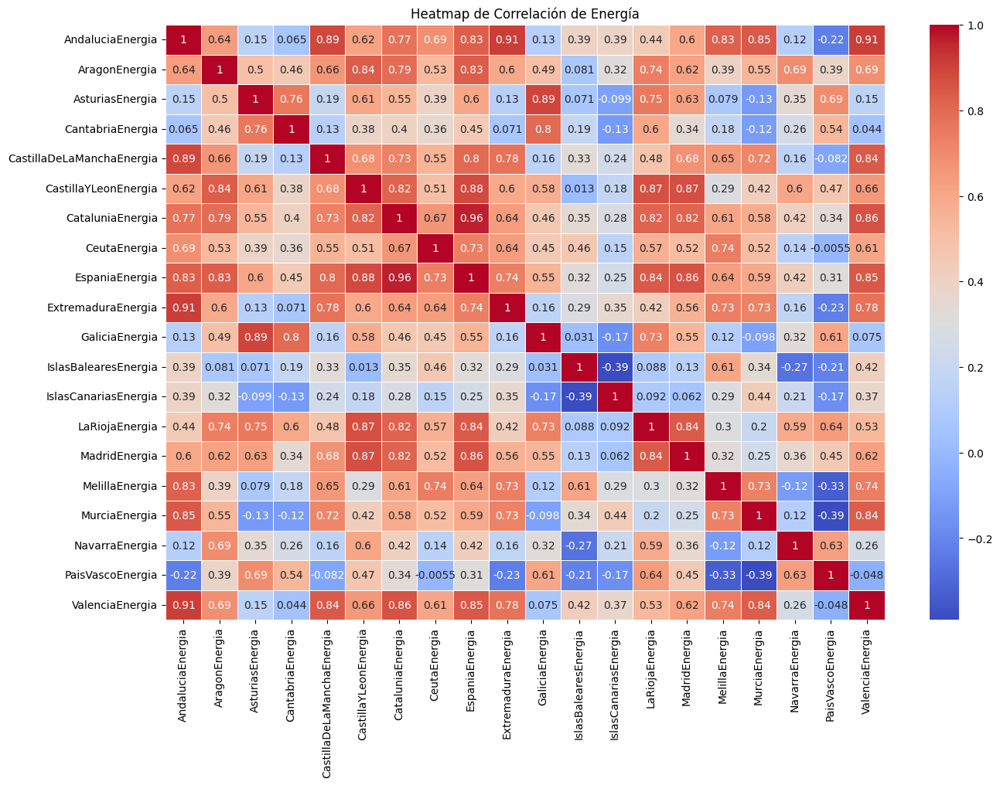

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar solo las columnas de energía
energia_columns = [col for col in df_final.columns if 'Energia' in col]

# Filtrar el DataFrame con solo las columnas de energía
df_energia = df_final[energia_columns]

# Crear el heatmap de correlación
plt.figure(figsize=(15, 10))
sns.heatmap(df_energia.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap de Correlación de Energía')
plt.show()


<Figure size 1200x1200 with 0 Axes>

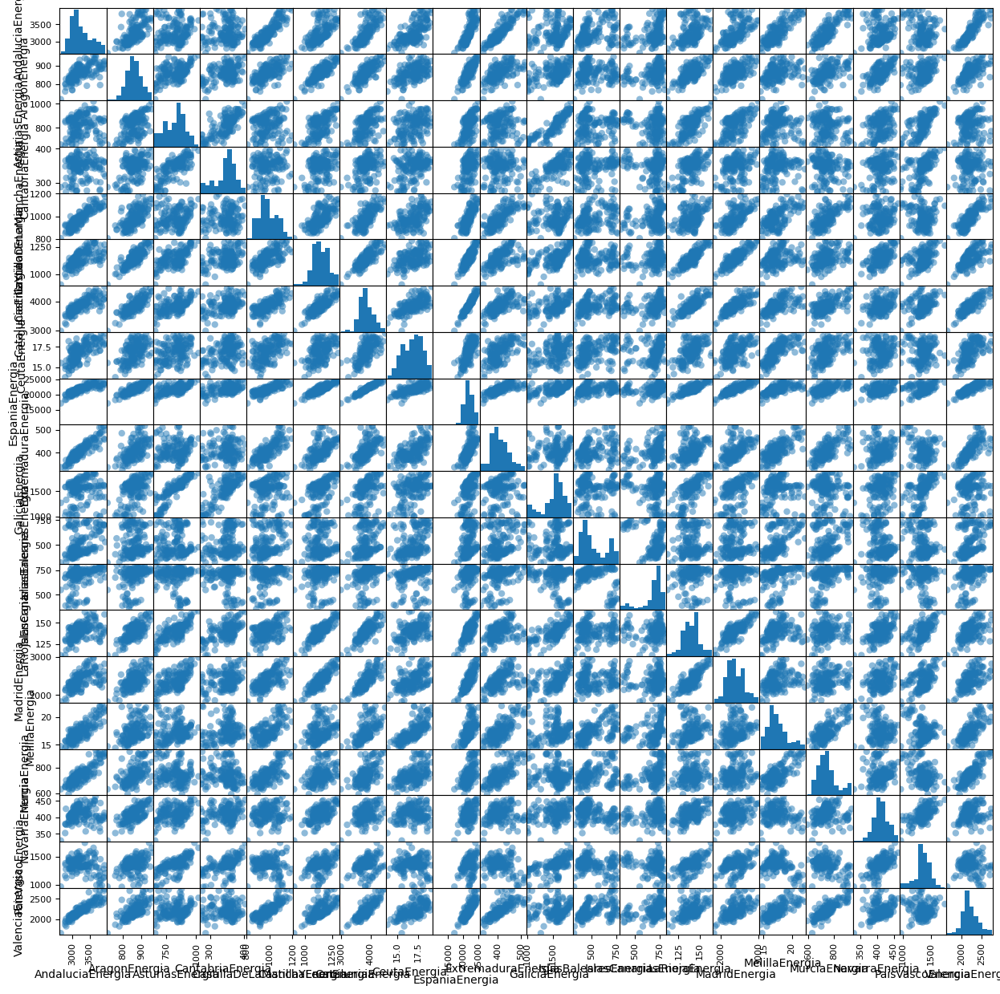

In [ ]:
from pandas.plotting import scatter_matrix

# Seleccionar solo las columnas de energía
energia_columns = [col for col in df_final.columns if 'Energia' in col]

# Filtrar el DataFrame con solo las columnas de energía
df_energia = df_final[energia_columns]

# Crear la matriz de scatterplot
plt.figure(figsize=(12, 12))
scatter_matrix(df_energia, alpha=0.5, figsize=(15, 15), diagonal='hist', marker='o')

# Mostrar el gráfico
plt.show()

## Analisis columnas Temperatura máxima

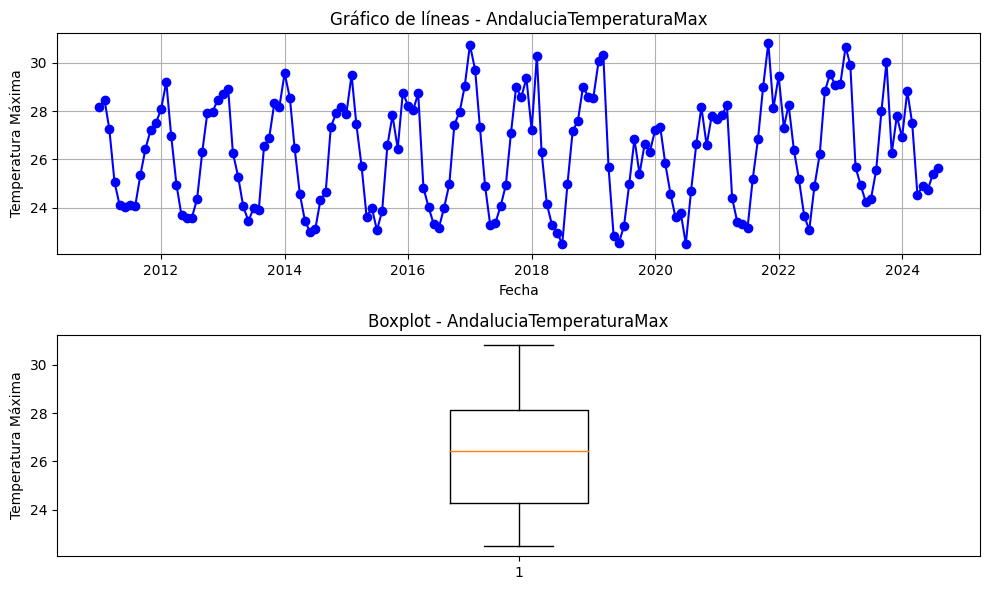

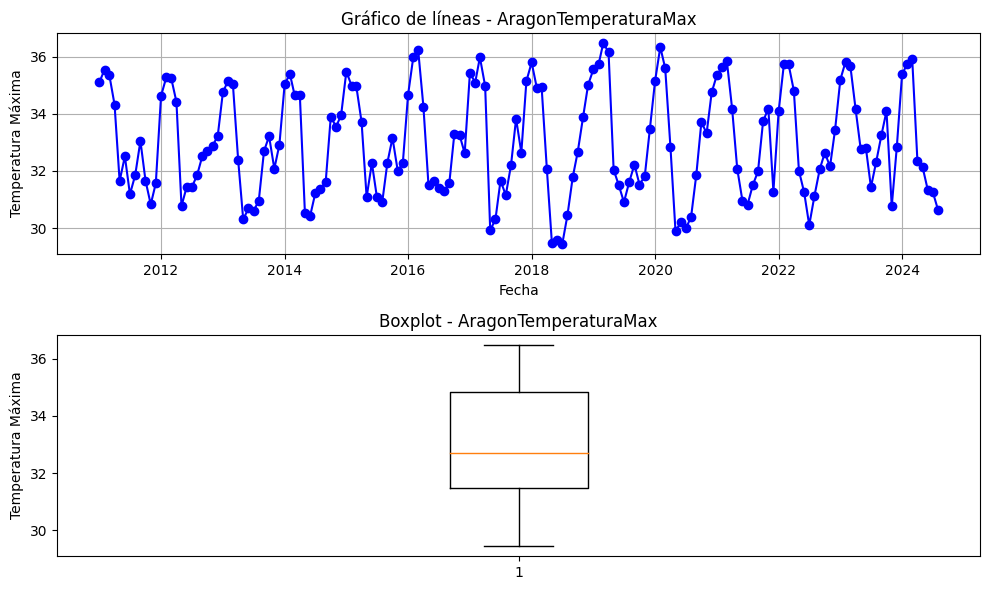

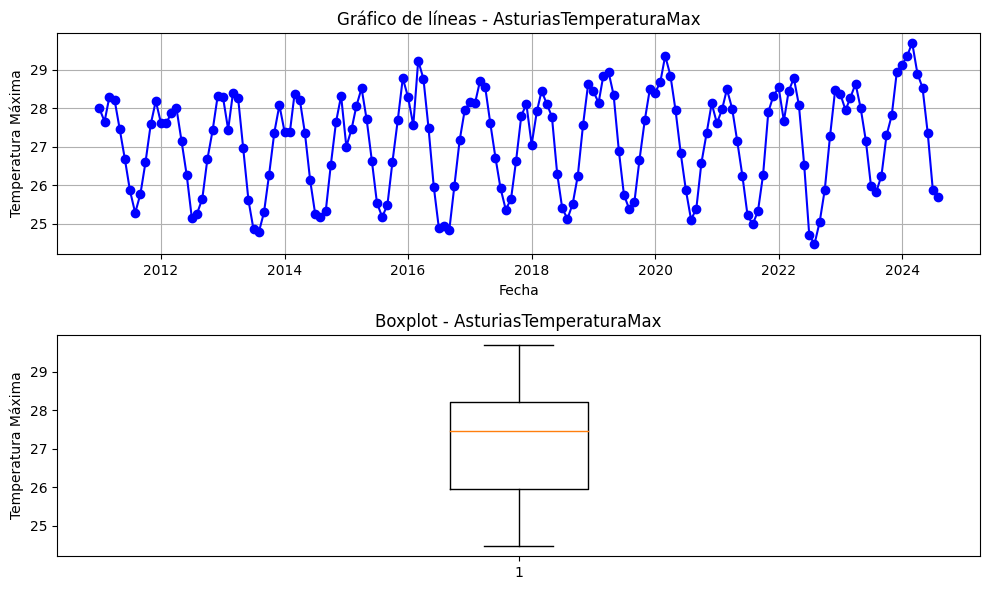

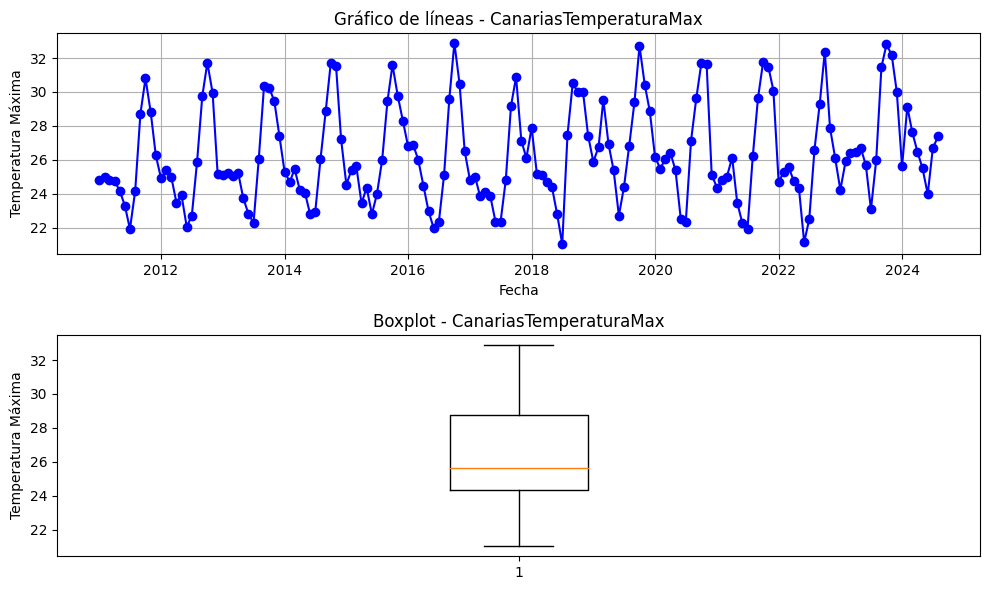

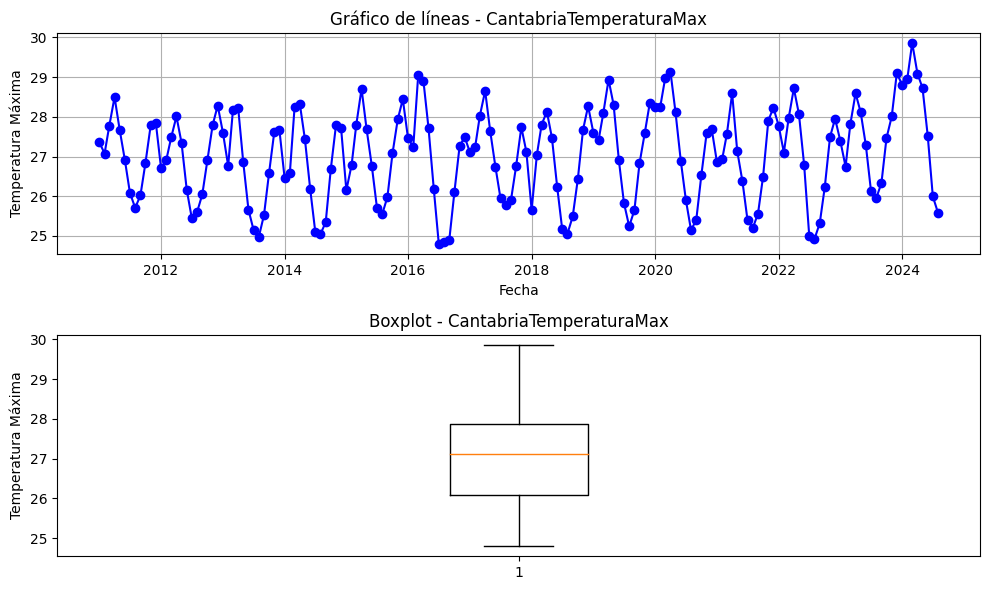

...

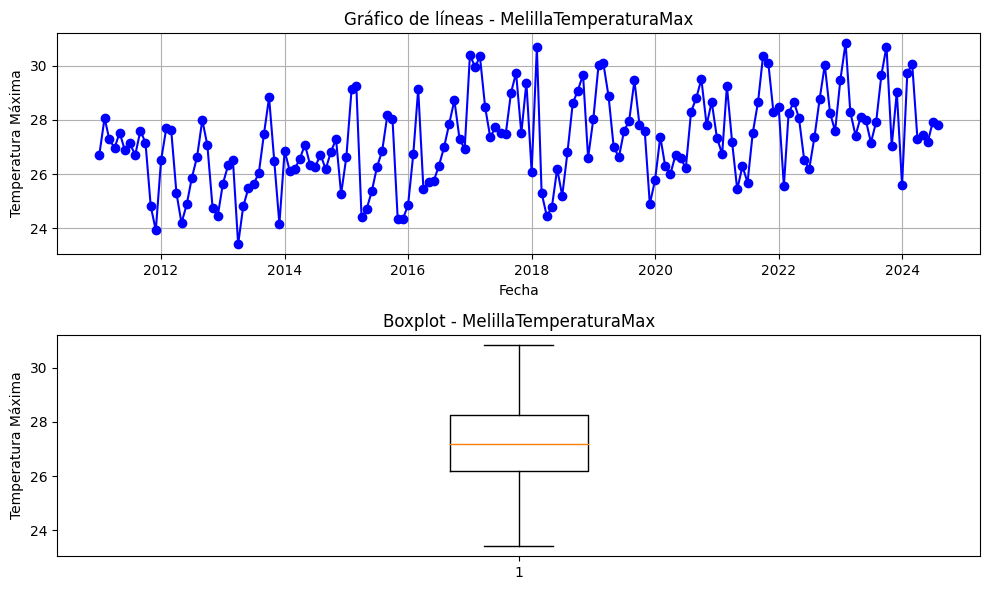

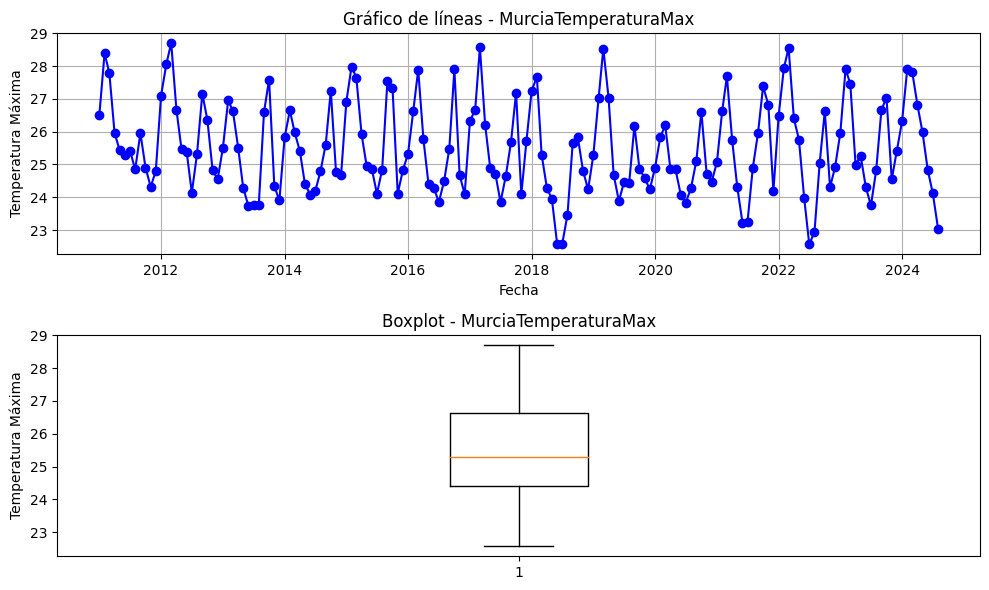

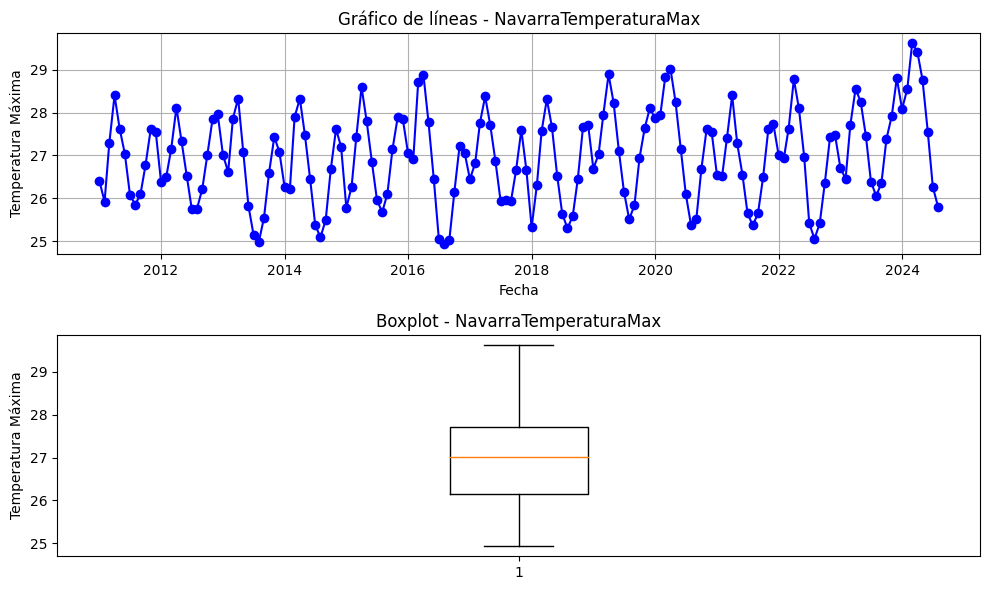

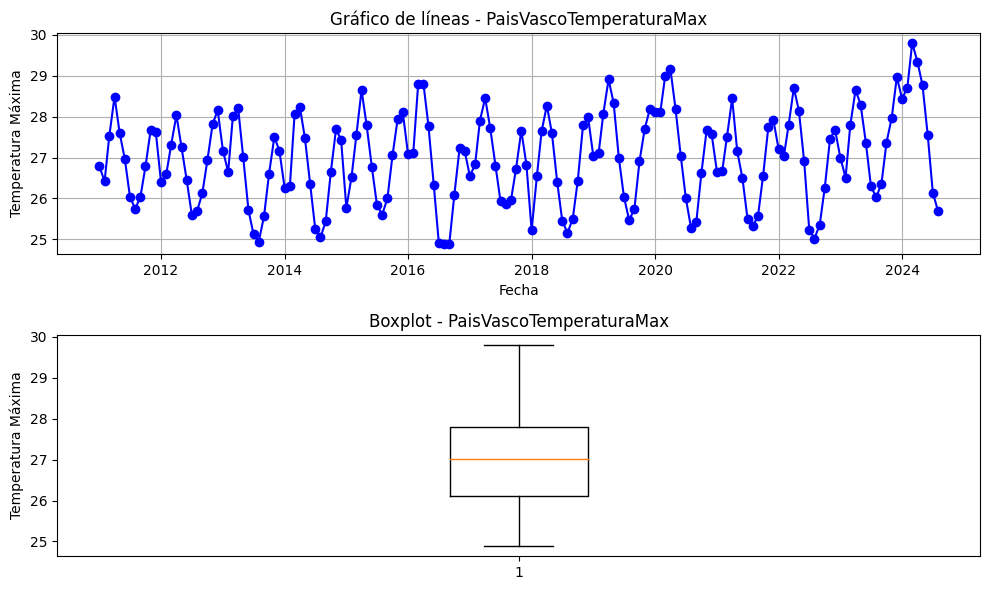

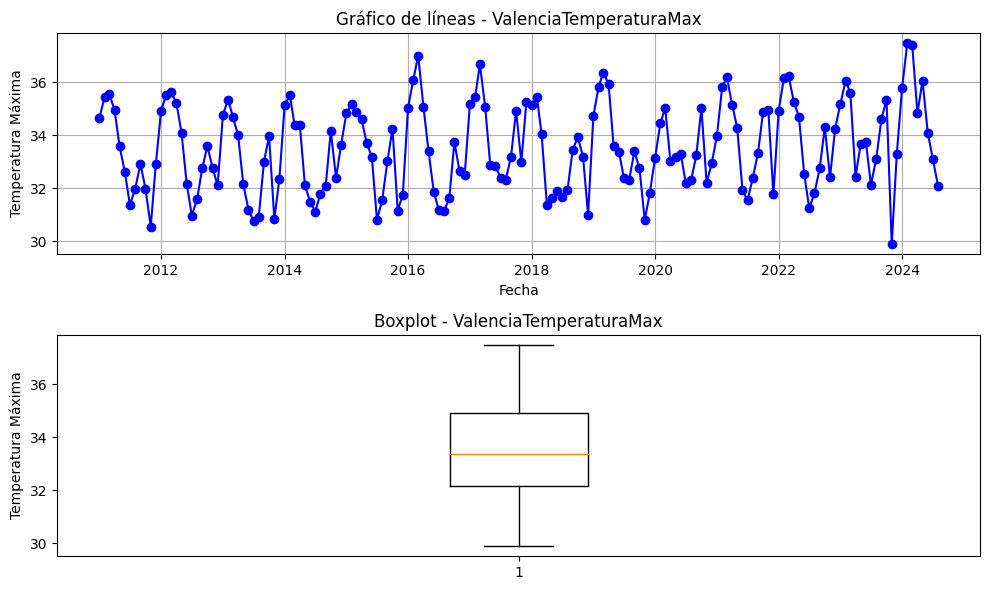

In [ ]:
import matplotlib.pyplot as plt

# Filtrar las columnas que contienen 'TemperaturaMax'
columnas_temp_max = [col for col in df_final.columns if 'TemperaturaMax' in col]

# Iterar sobre cada columna y graficar
for col in columnas_temp_max:
    plt.figure(figsize=(10, 6))

    # Gráfico de líneas
    plt.subplot(2, 1, 1)
    plt.plot(df_final['Fecha'], df_final[col], marker='o', linestyle='-', color='b')
    plt.title(f'Gráfico de líneas - {col}')
    plt.xlabel('Fecha')
    plt.ylabel('Temperatura Máxima')
    plt.grid(True)

    # Gráfico de boxplot
    plt.subplot(2, 1, 2)
    plt.boxplot(df_final[col].dropna())
    plt.title(f'Boxplot - {col}')
    plt.ylabel('Temperatura Máxima')

    # Ajustar el diseño para que no se superpongan los gráficos
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()


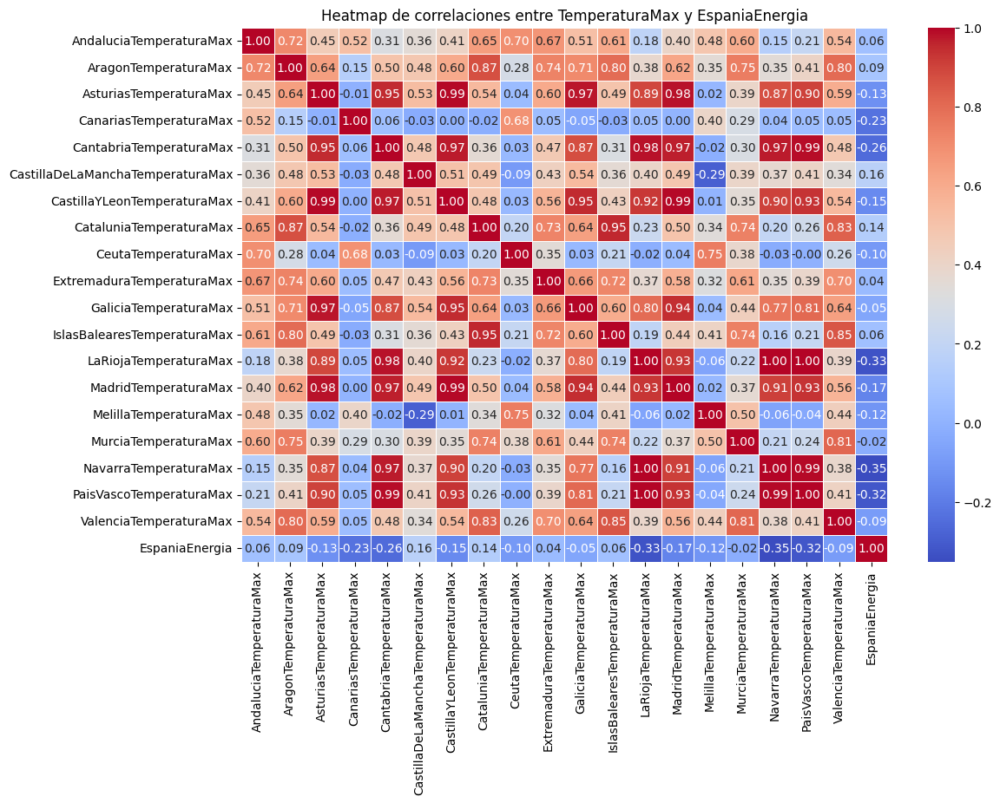

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar las columnas que contienen 'TemperaturaMax' y añadir 'EspaniaEnergia'
columnas_temp_max = [col for col in df_final.columns if 'TemperaturaMax' in col]
columnas_temp_max.append('EspaniaEnergia')

# Crear un heatmap de correlaciones
plt.figure(figsize=(12, 8))
correlaciones = df_final[columnas_temp_max].corr()
sns.heatmap(correlaciones, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Heatmap de correlaciones entre TemperaturaMax y EspaniaEnergia')
plt.show()


<Figure size 1500x1000 with 0 Axes>

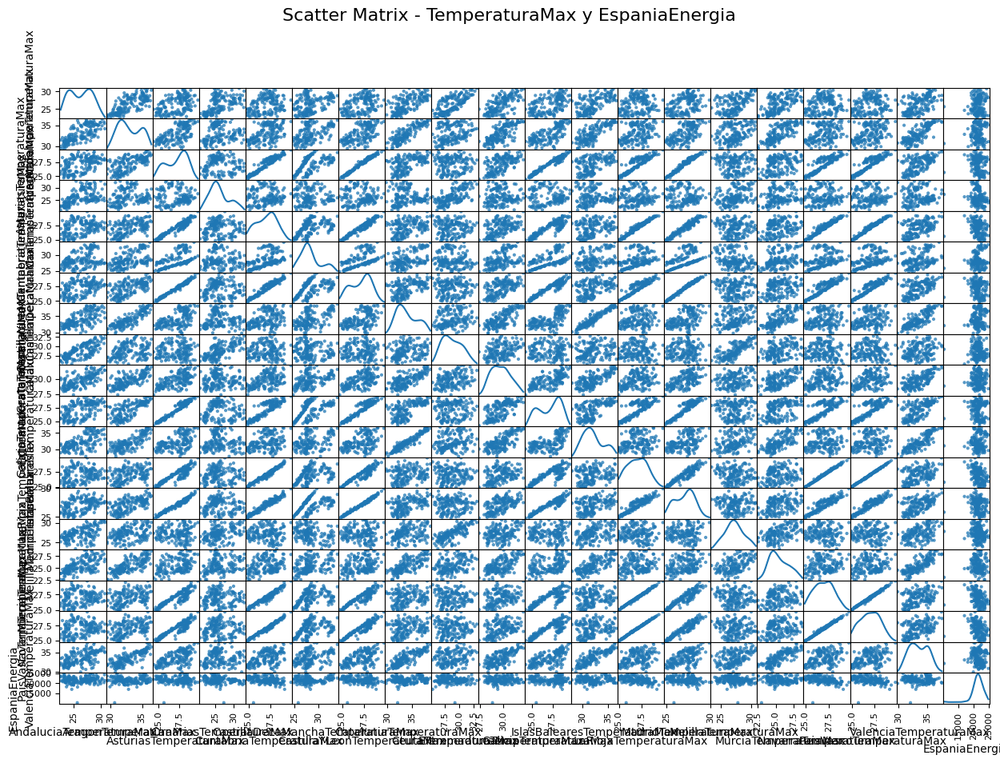

In [ ]:
from pandas.plotting import scatter_matrix

# Crear un scatter matrix
plt.figure(figsize=(15, 10))
scatter_matrix(df_final[columnas_temp_max], alpha=0.75, figsize=(15, 10), diagonal='kde')
plt.suptitle('Scatter Matrix - TemperaturaMax y EspaniaEnergia', fontsize=16)
plt.show()


## Analisis Columnas Temperatura mínima


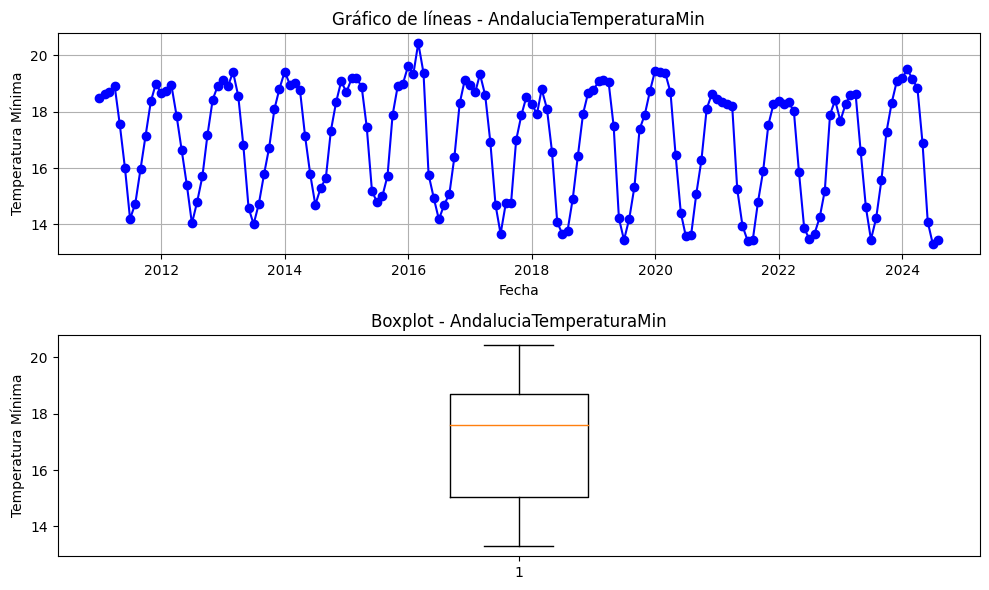

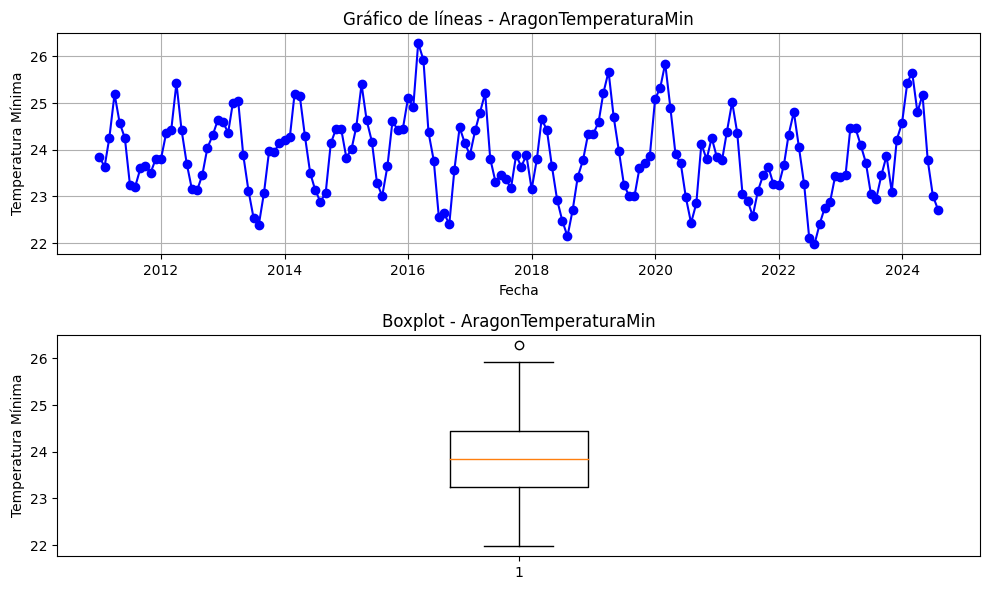

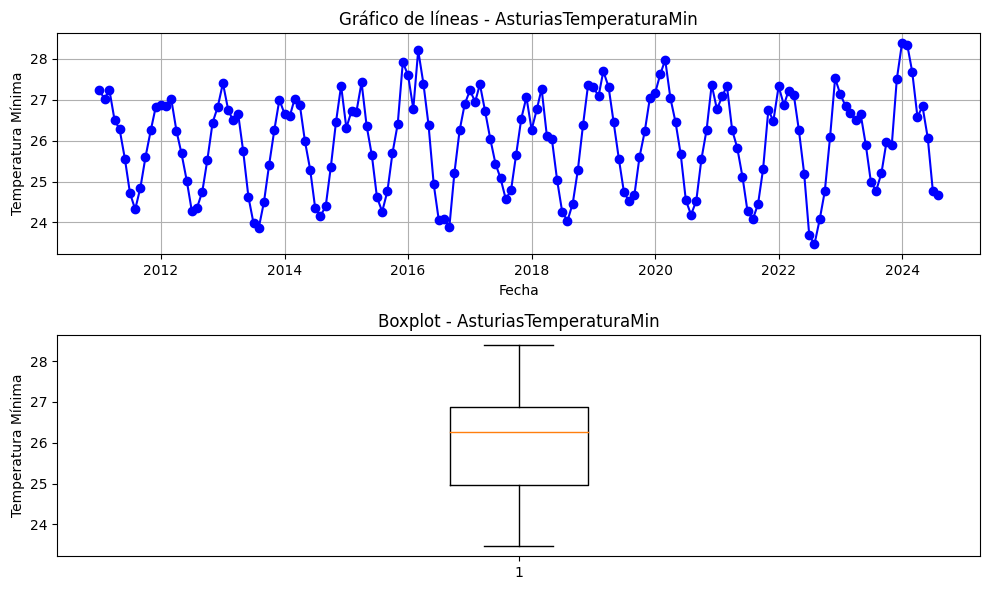

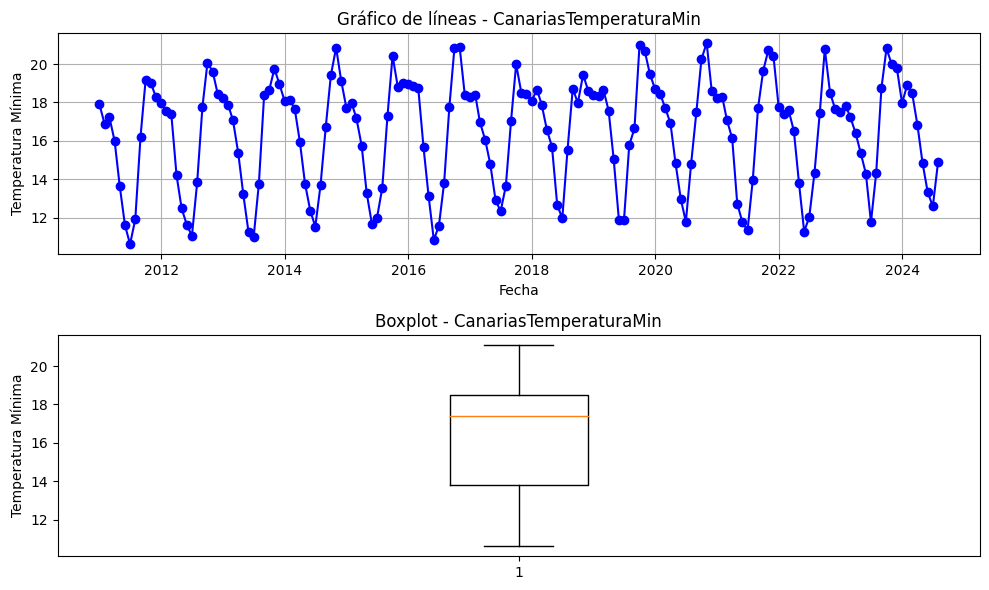

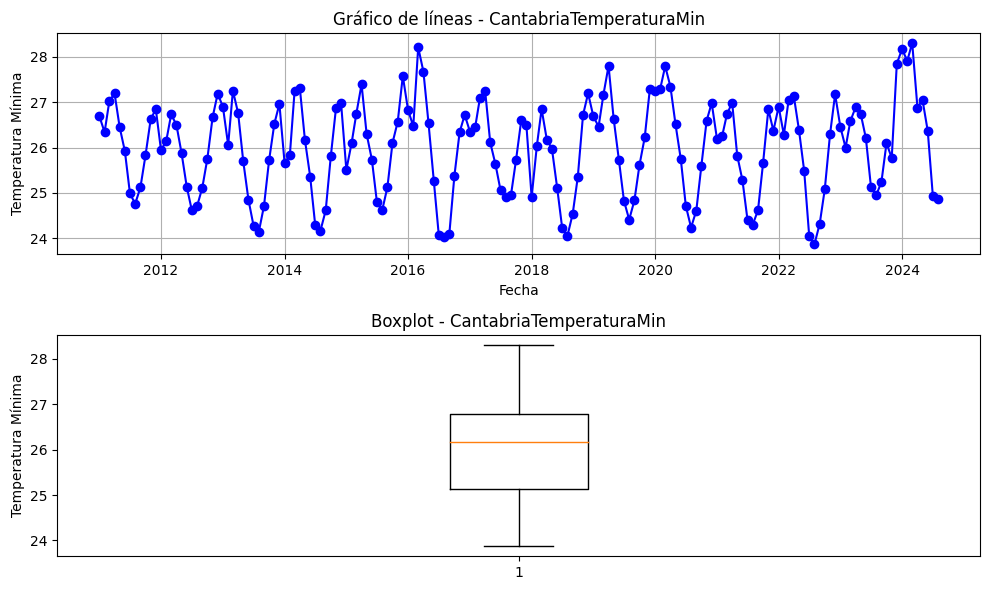

...

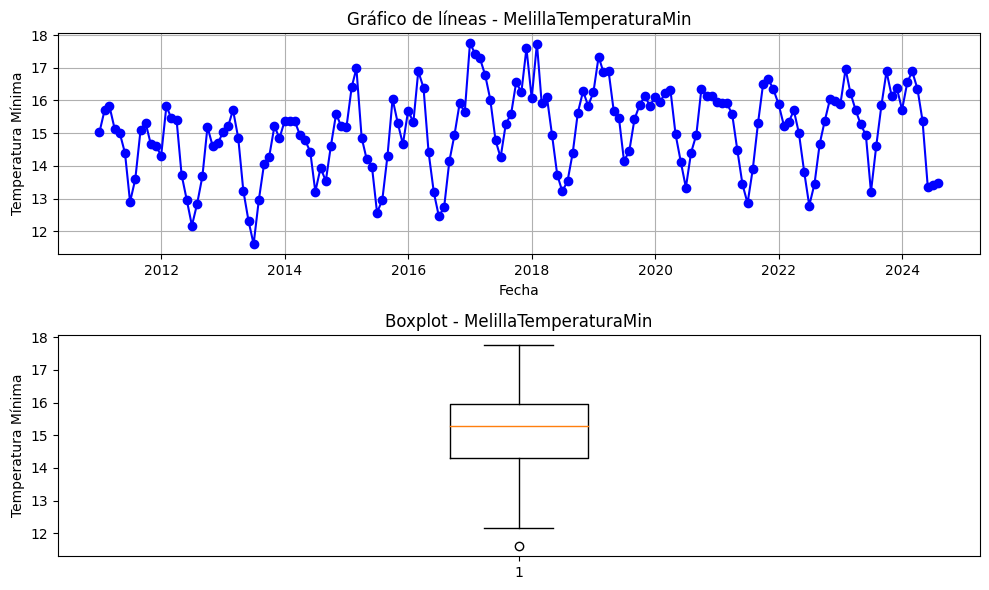

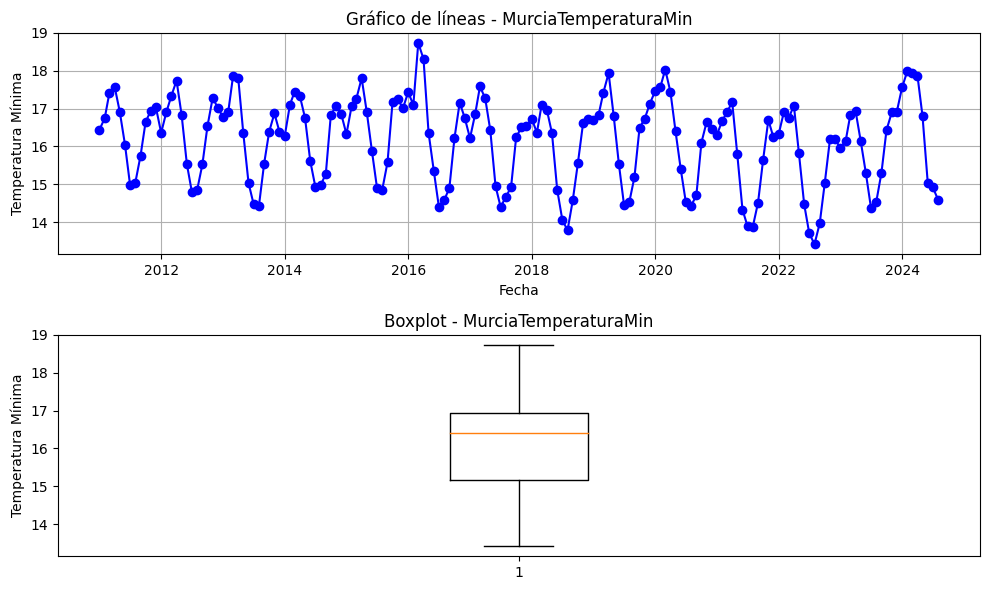

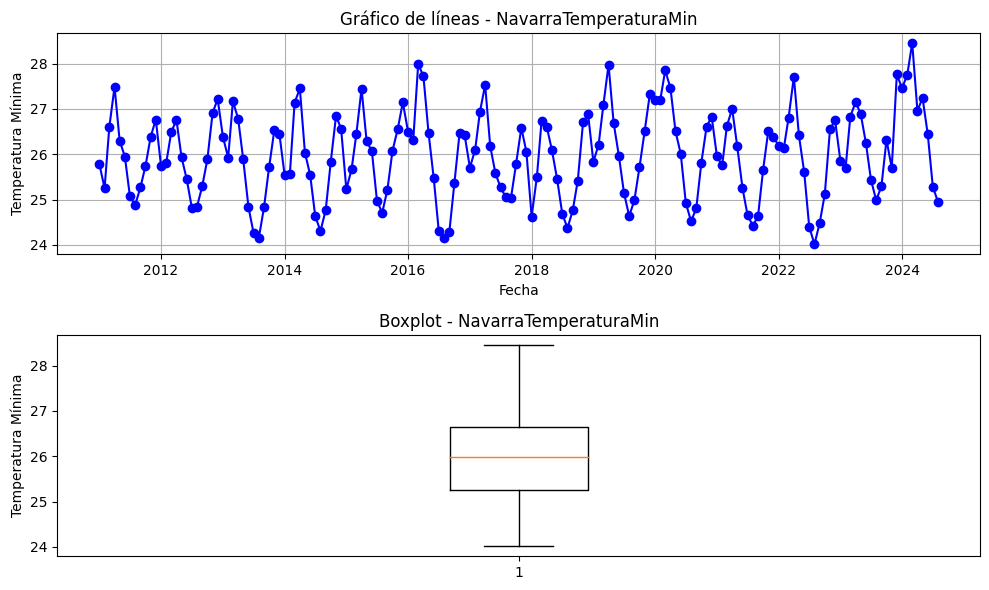

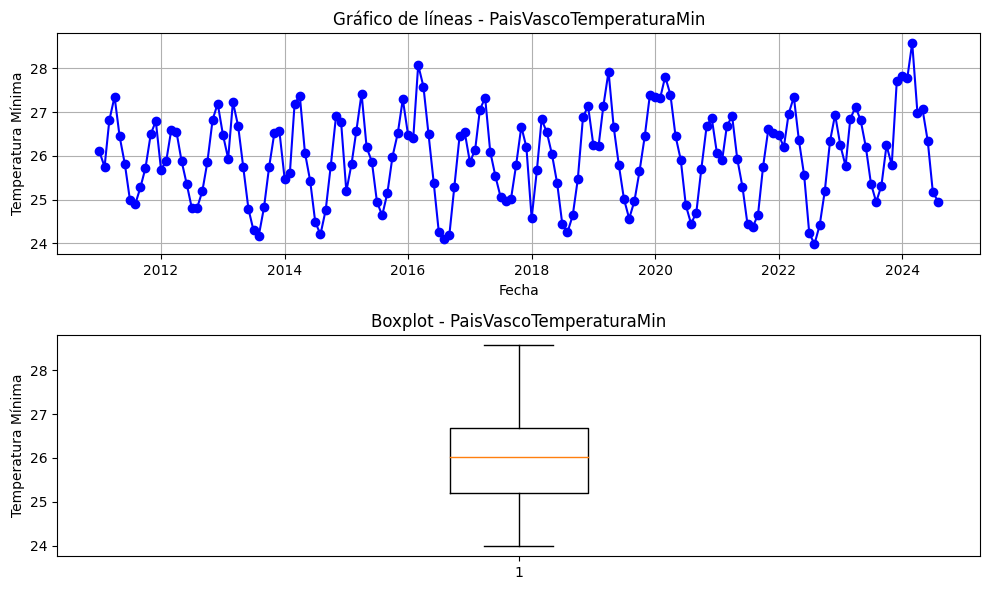

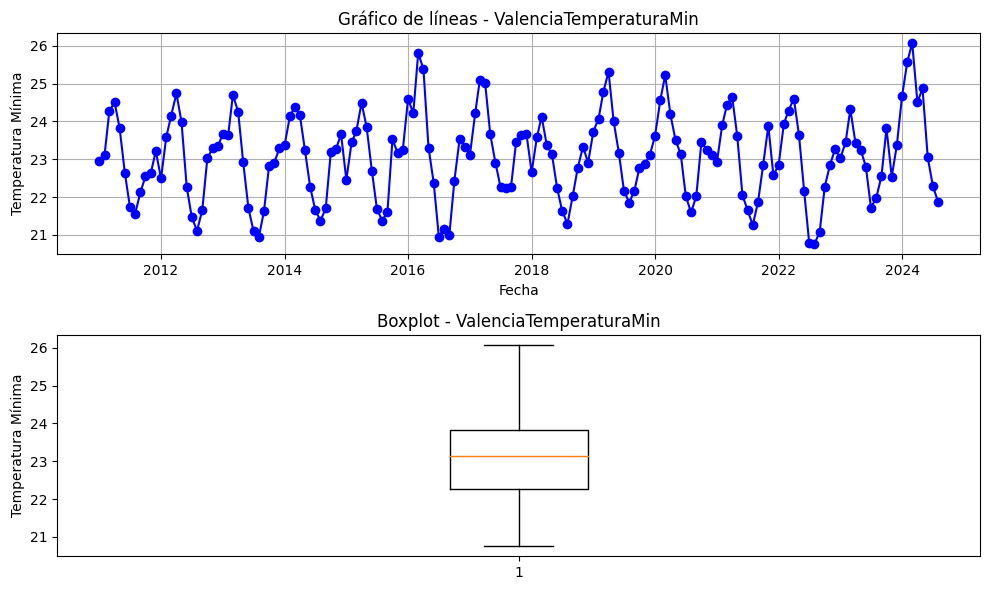

In [ ]:
import matplotlib.pyplot as plt

# Filtrar las columnas que contienen 'TemperaturaMin'
columnas_temp_max = [col for col in df_final.columns if 'TemperaturaMin' in col]

# Iterar sobre cada columna y graficar
for col in columnas_temp_max:
    plt.figure(figsize=(10, 6))

    # Gráfico de líneas
    plt.subplot(2, 1, 1)
    plt.plot(df_final['Fecha'], df_final[col], marker='o', linestyle='-', color='b')
    plt.title(f'Gráfico de líneas - {col}')
    plt.xlabel('Fecha')
    plt.ylabel('Temperatura Mínima')
    plt.grid(True)

    # Gráfico de boxplot
    plt.subplot(2, 1, 2)
    plt.boxplot(df_final[col].dropna())
    plt.title(f'Boxplot - {col}')
    plt.ylabel('Temperatura Mínima')

    # Ajustar el diseño para que no se superpongan los gráficos
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()

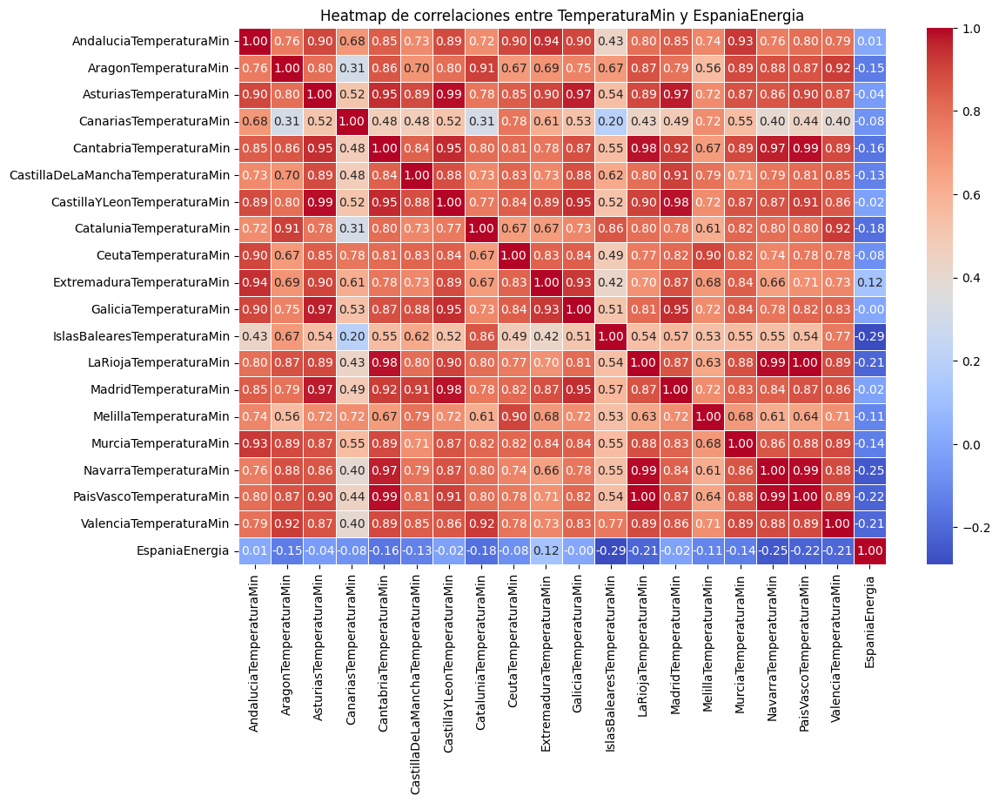

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar las columnas que contienen 'TemperaturaMin' y añadir 'EspaniaEnergia'
columnas_temp_max = [col for col in df_final.columns if 'TemperaturaMin' in col]
columnas_temp_max.append('EspaniaEnergia')

# Crear un heatmap de correlaciones
plt.figure(figsize=(12, 8))
correlaciones = df_final[columnas_temp_max].corr()
sns.heatmap(correlaciones, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Heatmap de correlaciones entre TemperaturaMin y EspaniaEnergia')
plt.show()


<Figure size 1500x1000 with 0 Axes>

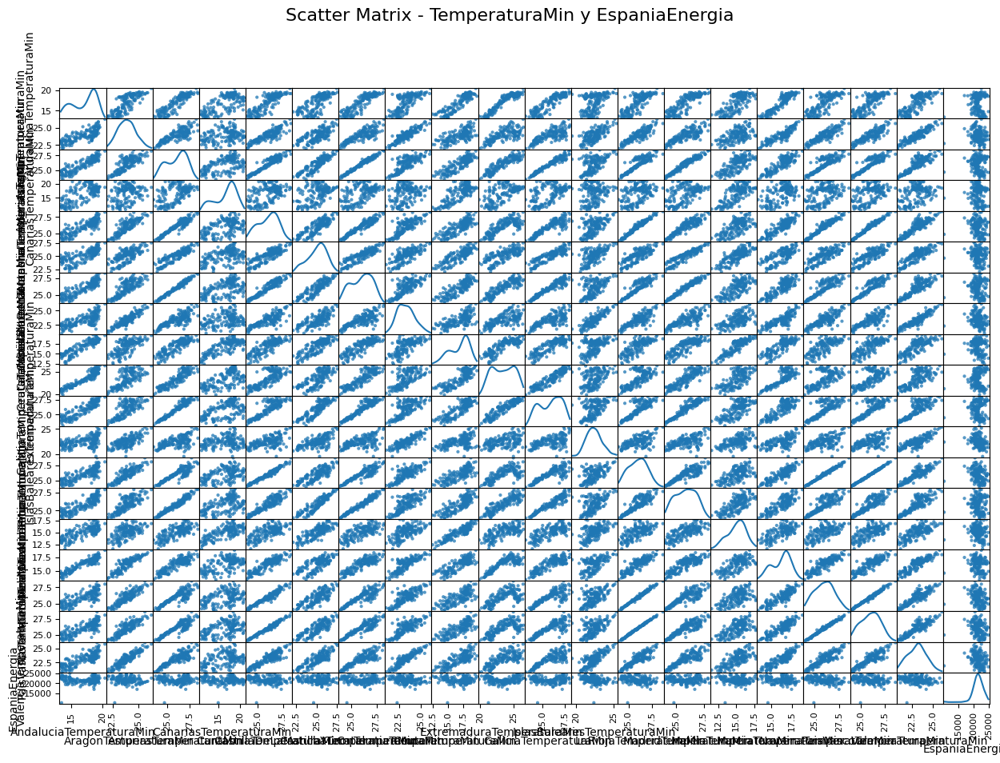

In [ ]:
from pandas.plotting import scatter_matrix

# Crear un scatter matrix
plt.figure(figsize=(15, 10))
scatter_matrix(df_final[columnas_temp_max], alpha=0.75, figsize=(15, 10), diagonal='kde')
plt.suptitle('Scatter Matrix - TemperaturaMin y EspaniaEnergia', fontsize=16)
plt.show()

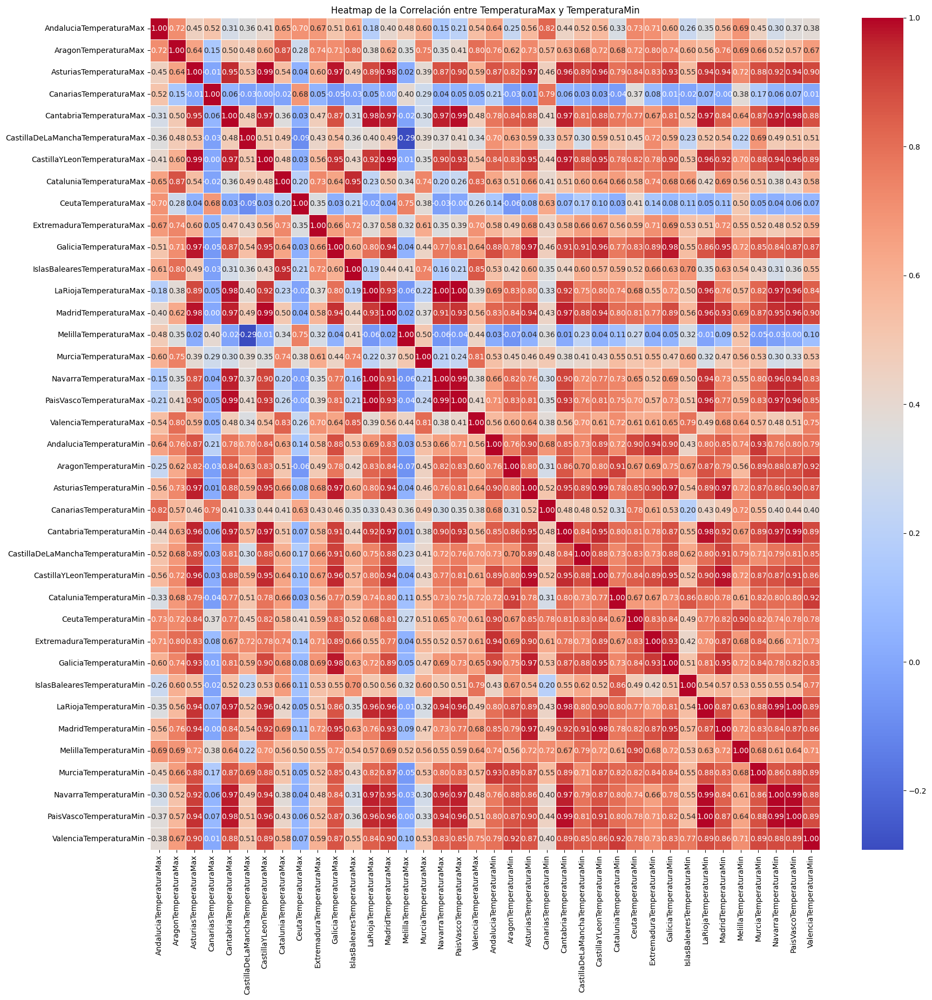

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar solo las columnas relacionadas con TemperaturaMax y TemperaturaMin
columnas_temperatura = [col for col in df_final.columns if 'TemperaturaMax' in col or 'TemperaturaMin' in col]
df_temperaturas = df_final[columnas_temperatura].dropna()

# Calcular la matriz de correlación
correlacion_temperaturas = df_temperaturas.corr()

# Crear el heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlacion_temperaturas, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Configurar el título
plt.title('Heatmap de la Correlación entre TemperaturaMax y TemperaturaMin')

# Mostrar el gráfico
plt.show()


## Analisis columnas duración del día

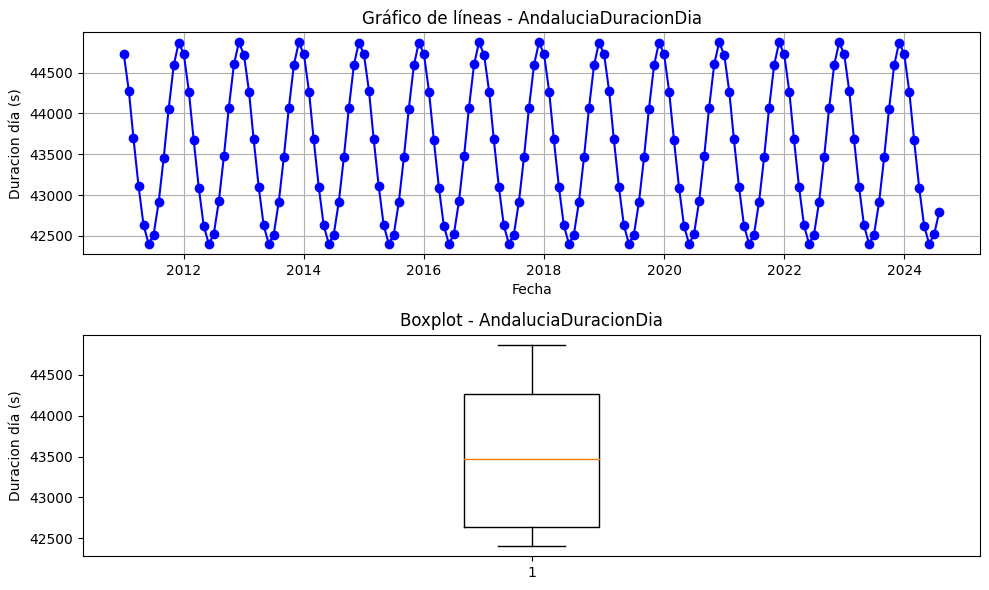

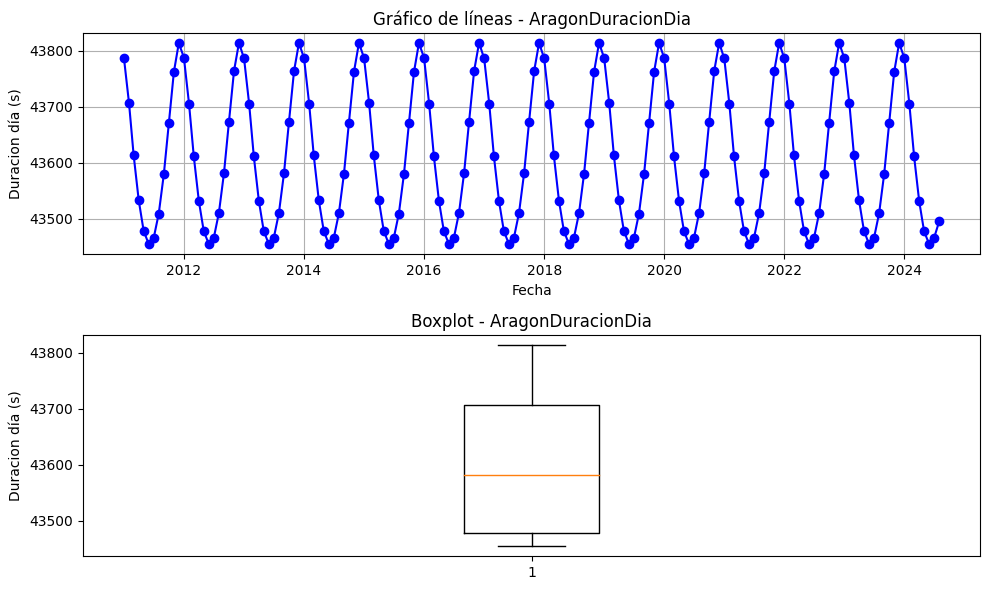

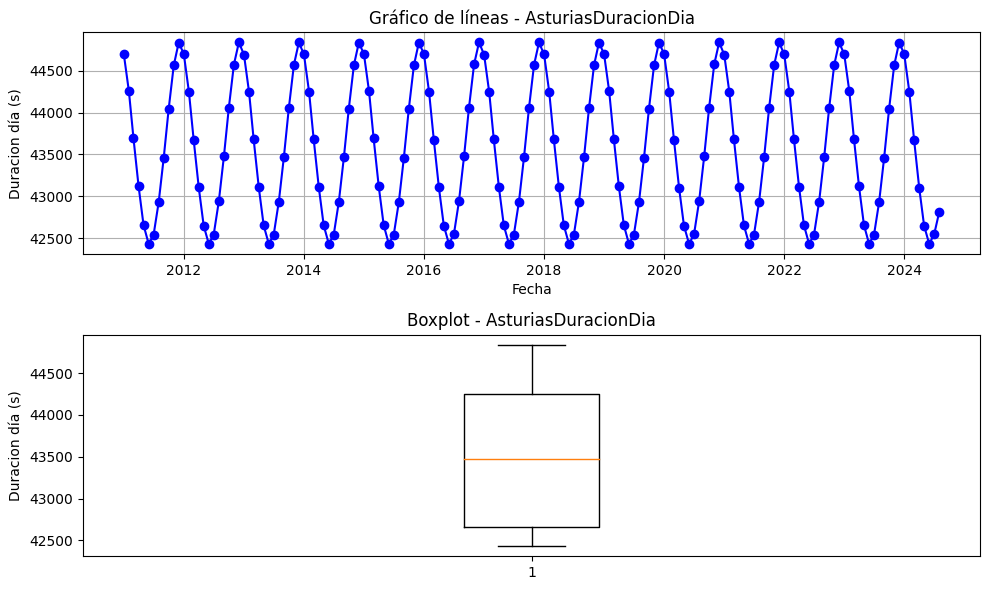

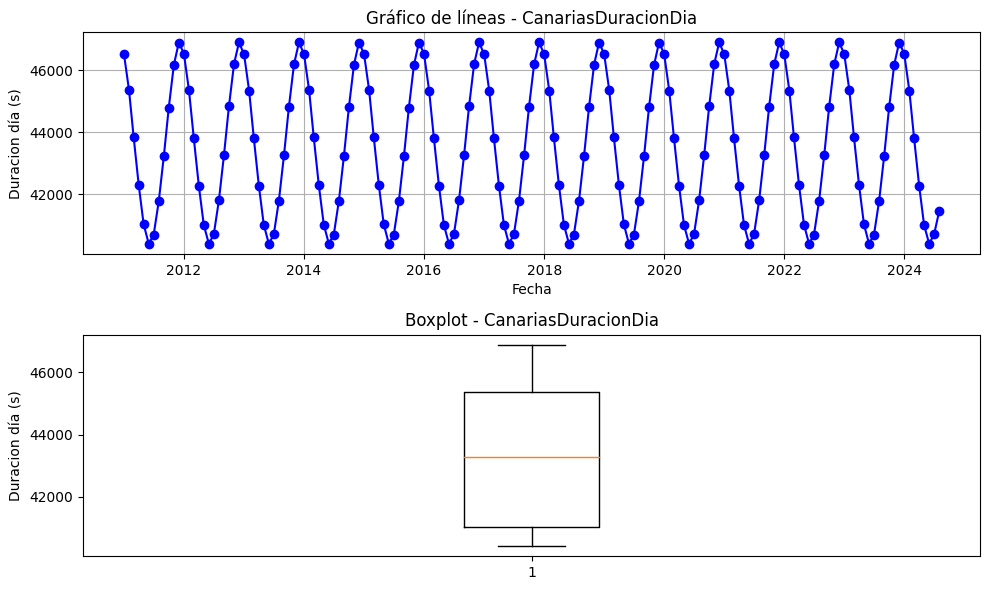

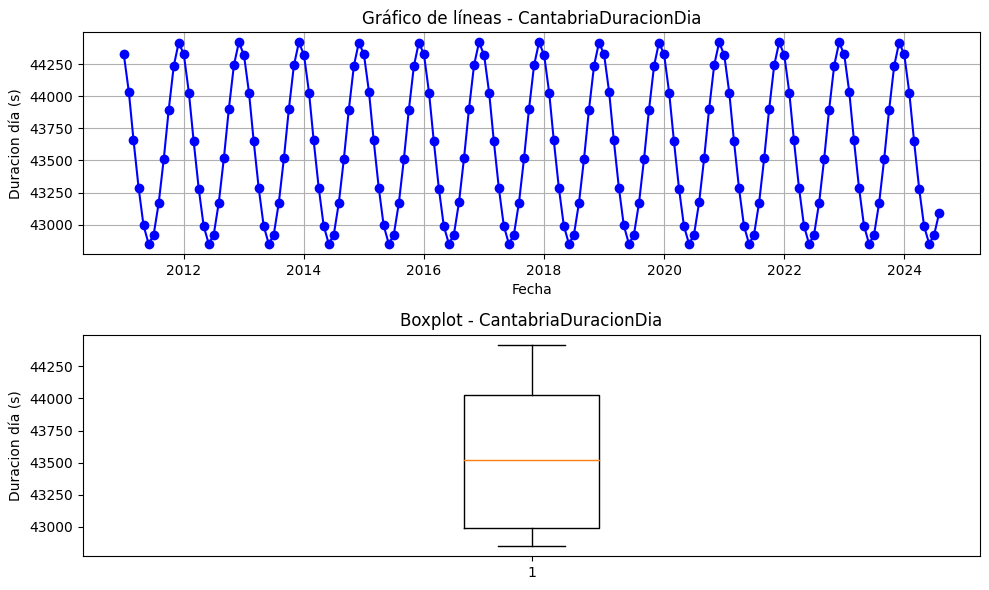

...

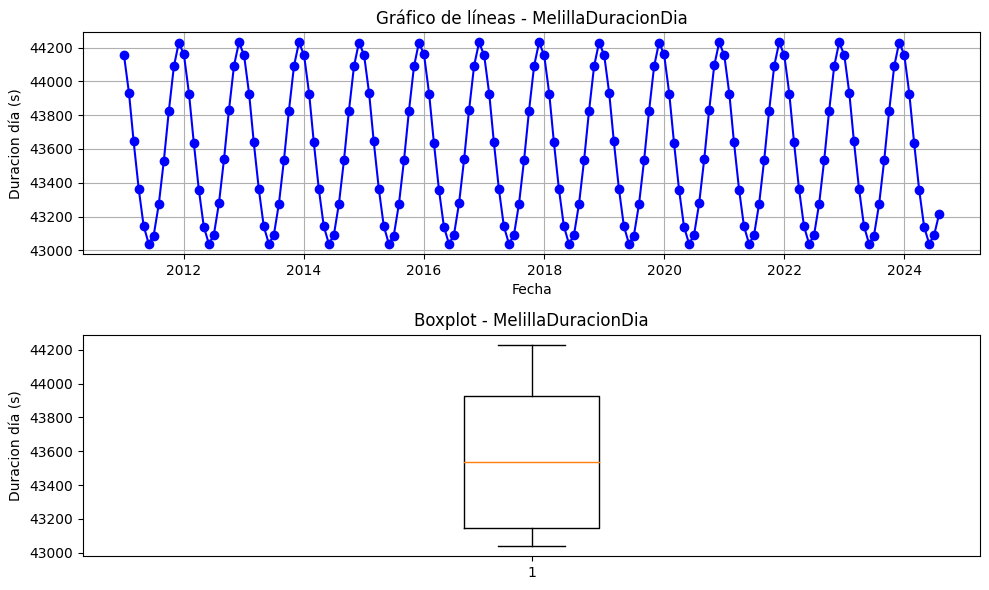

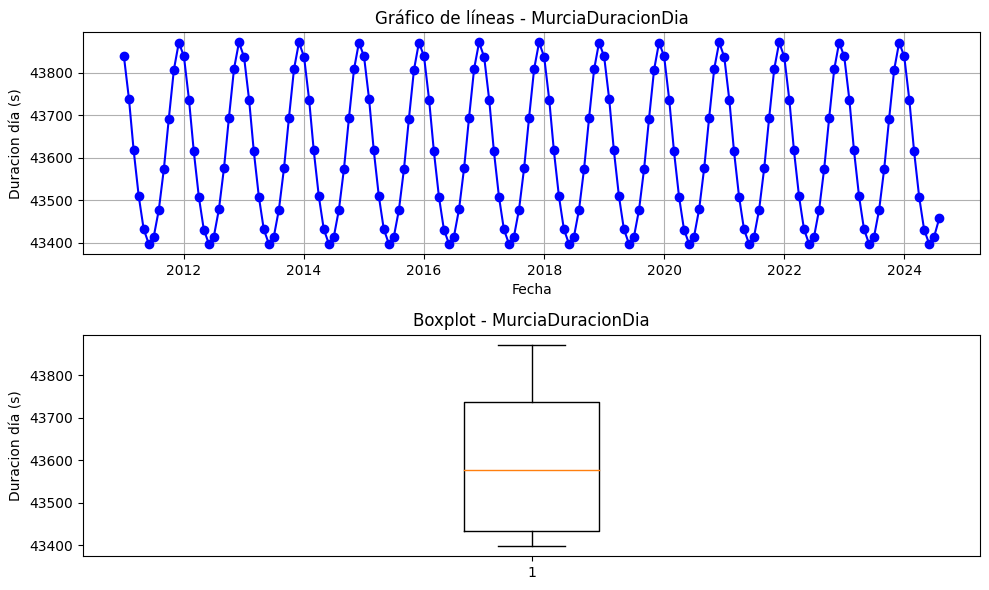

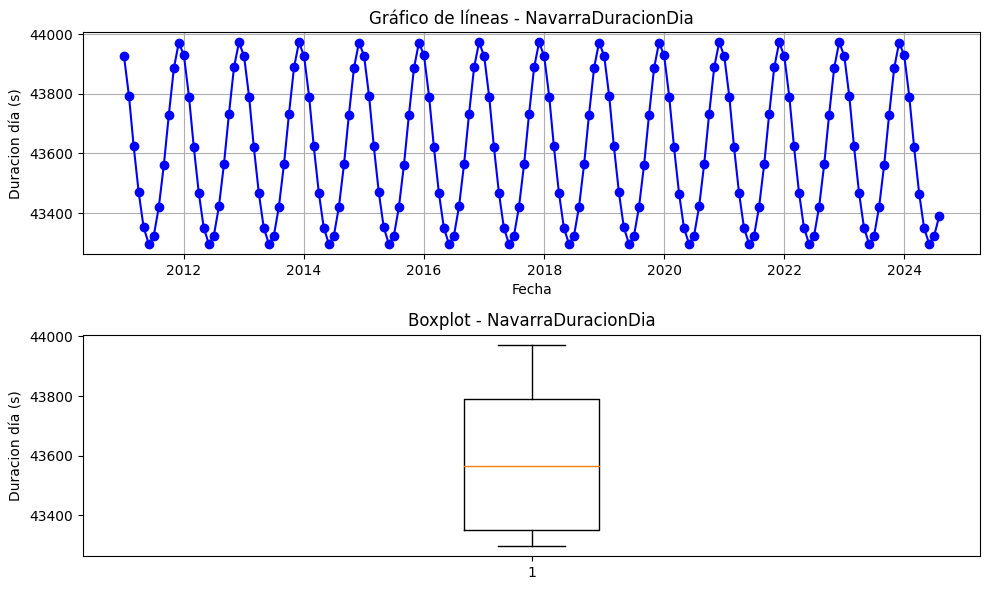

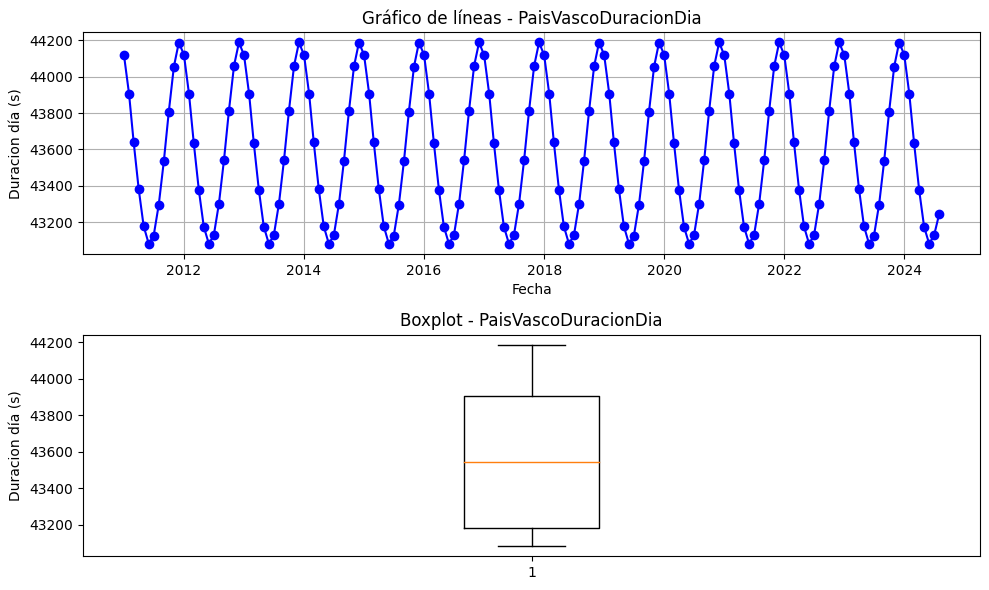

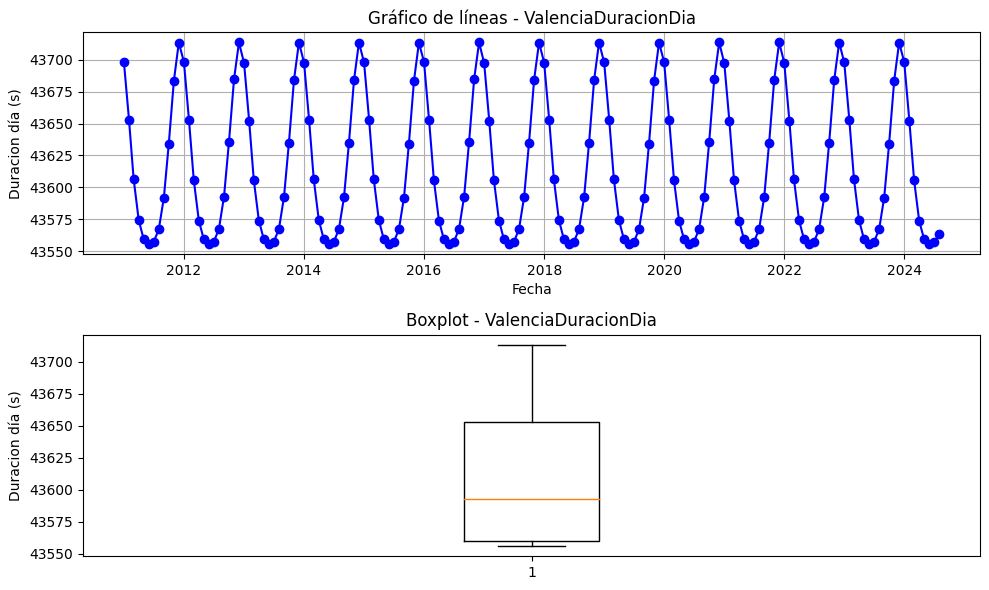

In [ ]:
import matplotlib.pyplot as plt

# Filtrar las columnas que contienen 'DuracionDia'
columnas_dura_dia = [col for col in df_final.columns if 'DuracionDia' in col]

# Iterar sobre cada columna y graficar
for col in columnas_dura_dia:
    plt.figure(figsize=(10, 6))

    # Gráfico de líneas
    plt.subplot(2, 1, 1)
    plt.plot(df_final['Fecha'], df_final[col], marker='o', linestyle='-', color='b')
    plt.title(f'Gráfico de líneas - {col}')
    plt.xlabel('Fecha')
    plt.ylabel('Duracion día (s)')
    plt.grid(True)

    # Gráfico de boxplot
    plt.subplot(2, 1, 2)
    plt.boxplot(df_final[col].dropna())
    plt.title(f'Boxplot - {col}')
    plt.ylabel('Duracion día (s)')

    # Ajustar el diseño para que no se superpongan los gráficos
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()

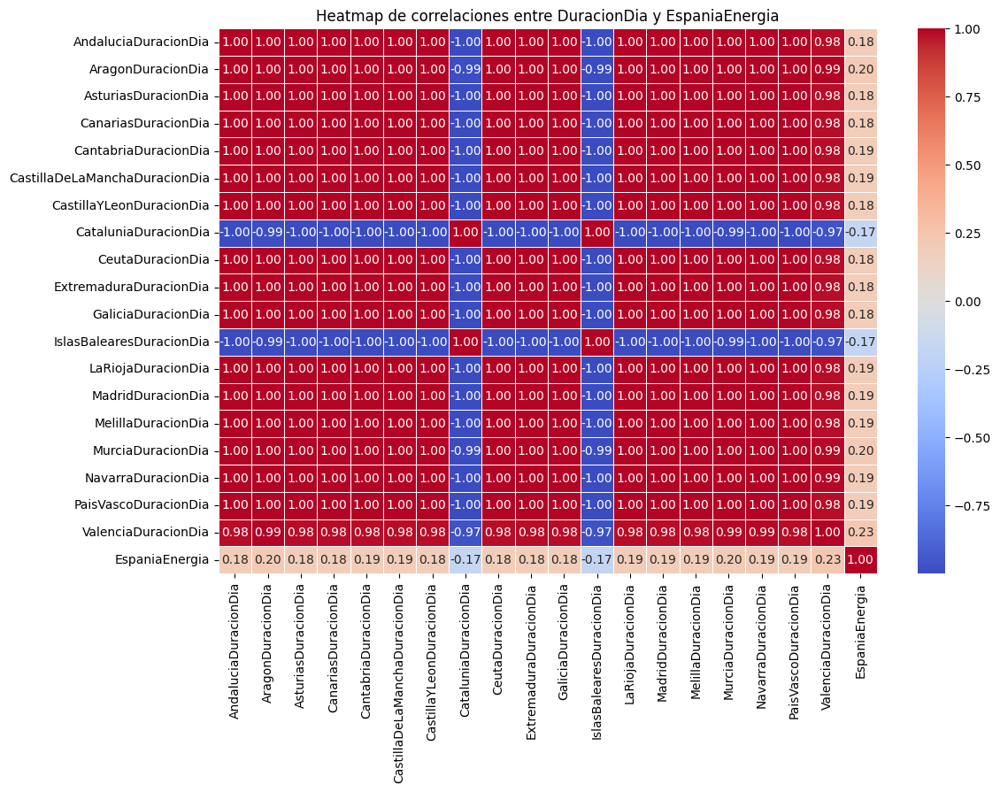

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar las columnas que contienen 'DuracionDia' y añadir 'EspaniaEnergia'
columnas_dura_dia = [col for col in df_final.columns if 'DuracionDia' in col]
columnas_dura_dia.append('EspaniaEnergia')

# Crear un heatmap de correlaciones
plt.figure(figsize=(12, 8))
correlaciones = df_final[columnas_dura_dia].corr()
sns.heatmap(correlaciones, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Heatmap de correlaciones entre DuracionDia y EspaniaEnergia')
plt.show()

<Figure size 1500x1000 with 0 Axes>

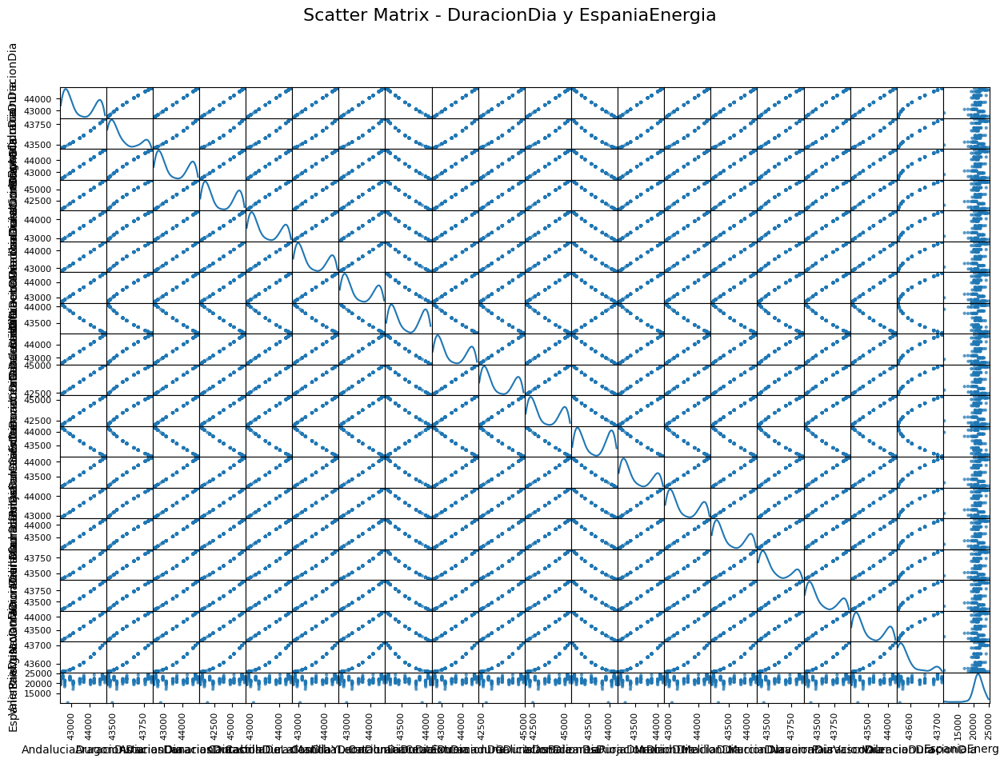

In [ ]:
from pandas.plotting import scatter_matrix

# Crear un scatter matrix
plt.figure(figsize=(15, 10))
scatter_matrix(df_final[columnas_dura_dia], alpha=0.75, figsize=(15, 10), diagonal='kde')
plt.suptitle('Scatter Matrix - DuracionDia y EspaniaEnergia', fontsize=16)
plt.show()

## Análisis columna Población

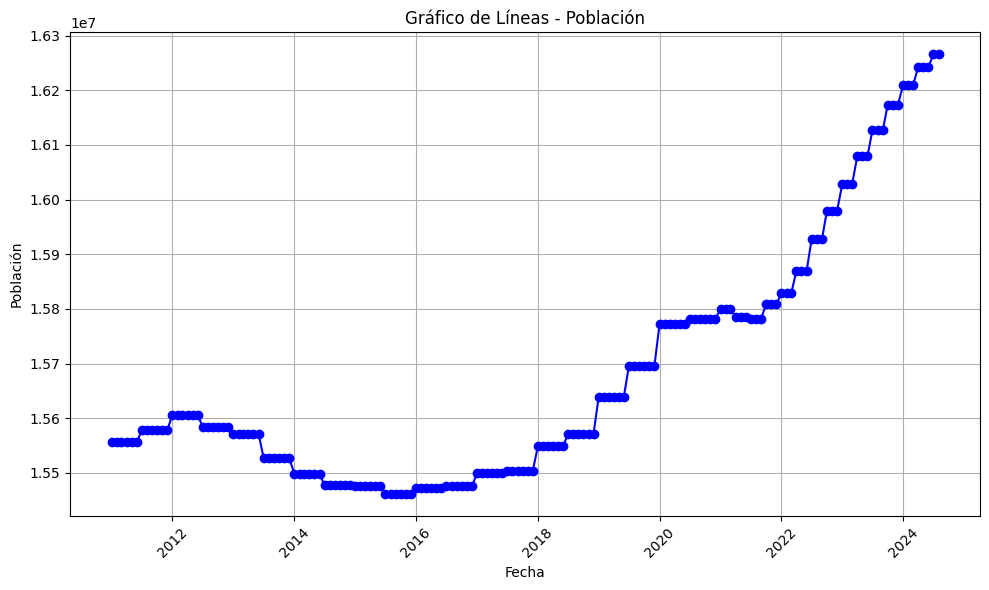

In [ ]:
import matplotlib.pyplot as plt

# Gráfico de líneas para la columna Población
plt.figure(figsize=(10, 6))
plt.plot(df_final['Fecha'], df_final['Poblacion'], marker='o', linestyle='-', color='b')
plt.title('Gráfico de Líneas - Población')
plt.xlabel('Fecha')
plt.ylabel('Población')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


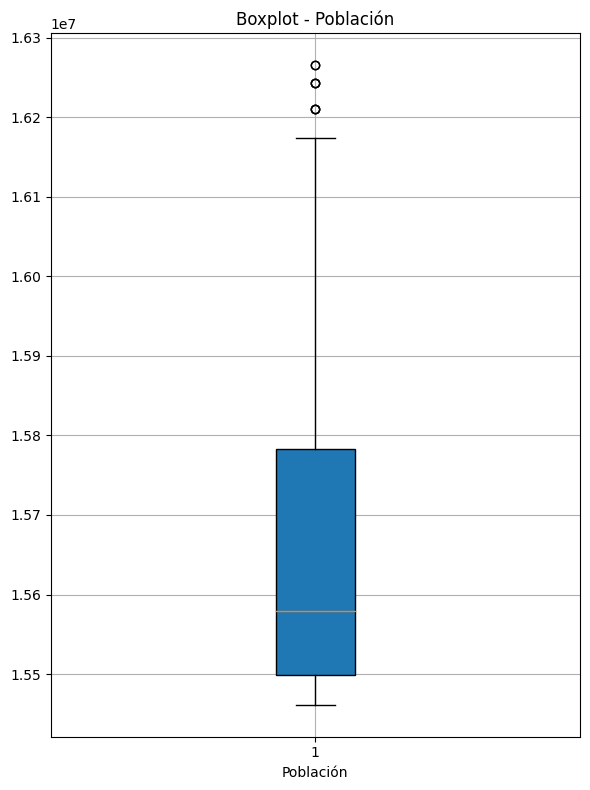

In [ ]:
# Boxplot para la columna Población
plt.figure(figsize=(6, 8))
plt.boxplot(df_final['Poblacion'].dropna(), patch_artist=True)
plt.title('Boxplot - Población')
plt.xlabel('Población')
plt.grid(True)
plt.tight_layout()
plt.show()


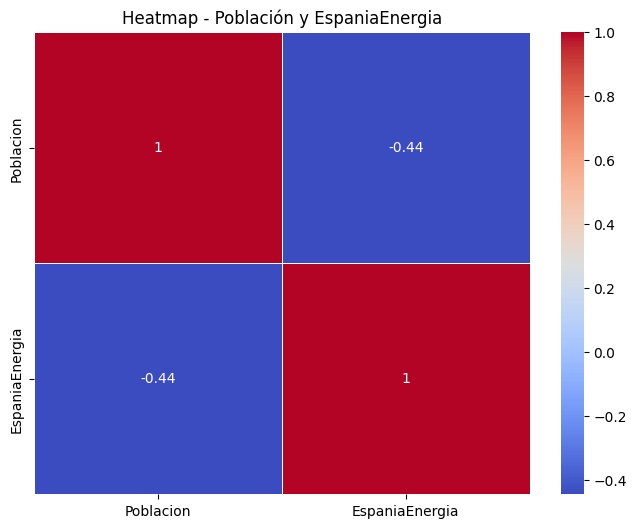

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear un DataFrame con solo las columnas Población y EspaniaEnergia
df_heatmap = df_final[['Poblacion', 'EspaniaEnergia']].dropna()

# Calcular la correlación entre las dos columnas
correlacion = df_heatmap.corr()

# Crear el heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap - Población y EspaniaEnergia')
plt.show()


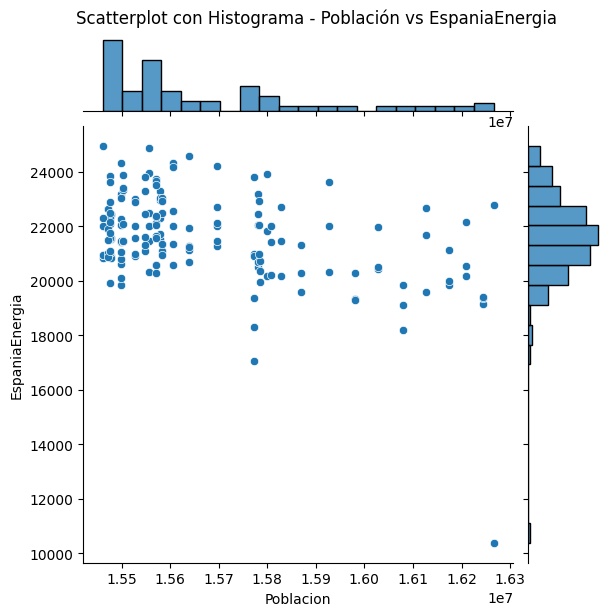

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear un DataFrame con solo las columnas Población y EspaniaEnergia
df_scatter = df_final[['Poblacion', 'EspaniaEnergia']].dropna()

# Crear el scatterplot con histogramas
sns.jointplot(x='Poblacion', y='EspaniaEnergia', data=df_scatter, kind='scatter', marginal_kws=dict(bins=20, fill=True))

# Configurar el título
plt.suptitle('Scatterplot con Histograma - Población vs EspaniaEnergia', y=1.02)

# Mostrar el gráfico
plt.show()


## Análisis columna PIB

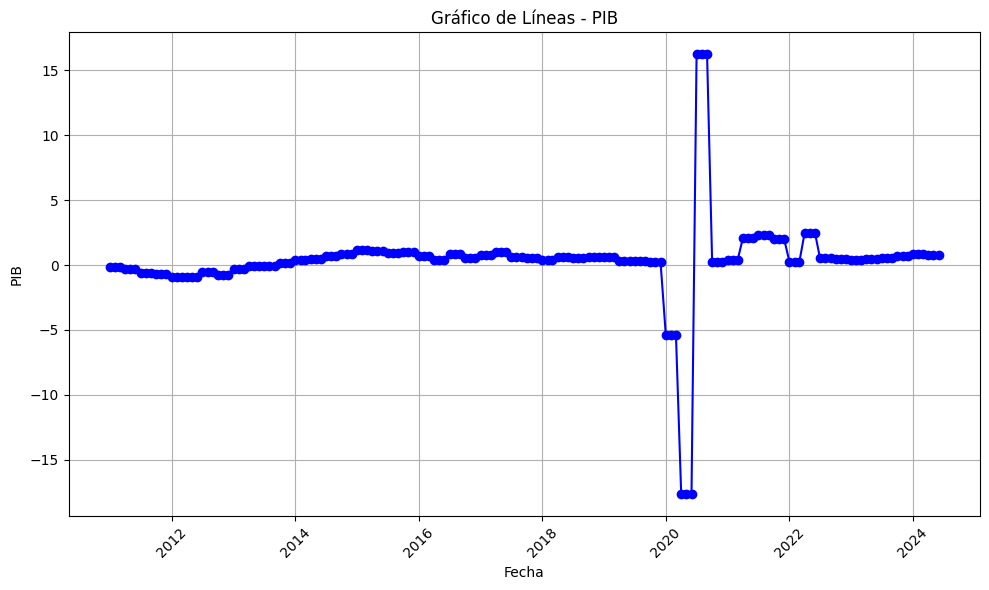

In [ ]:
import matplotlib.pyplot as plt

# Gráfico de líneas para la columna PIB
plt.figure(figsize=(10, 6))
plt.plot(df_final['Fecha'], df_final['PIB'], marker='o', linestyle='-', color='b')
plt.title('Gráfico de Líneas - PIB')
plt.xlabel('Fecha')
plt.ylabel('PIB')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

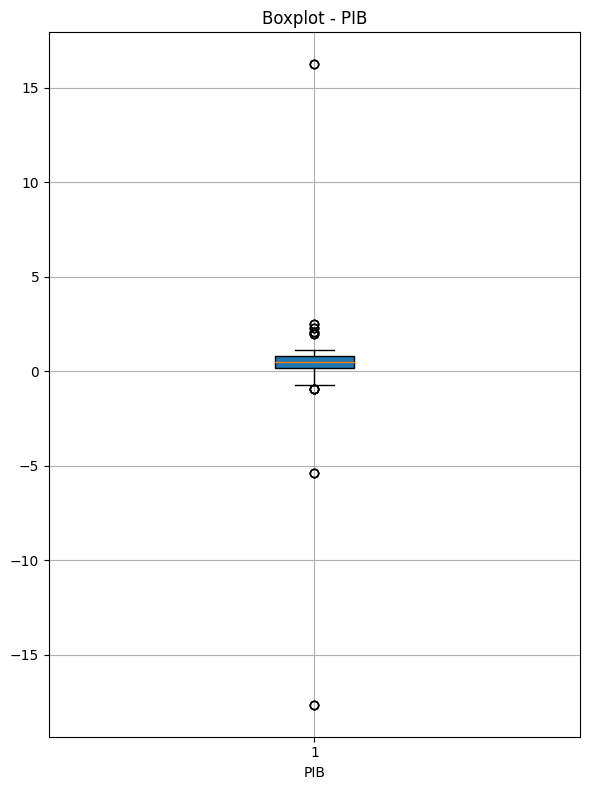

In [ ]:
# Boxplot para la columna PIB
plt.figure(figsize=(6, 8))
plt.boxplot(df_final['PIB'].dropna(), patch_artist=True)
plt.title('Boxplot - PIB')
plt.xlabel('PIB')
plt.grid(True)
plt.tight_layout()
plt.show()


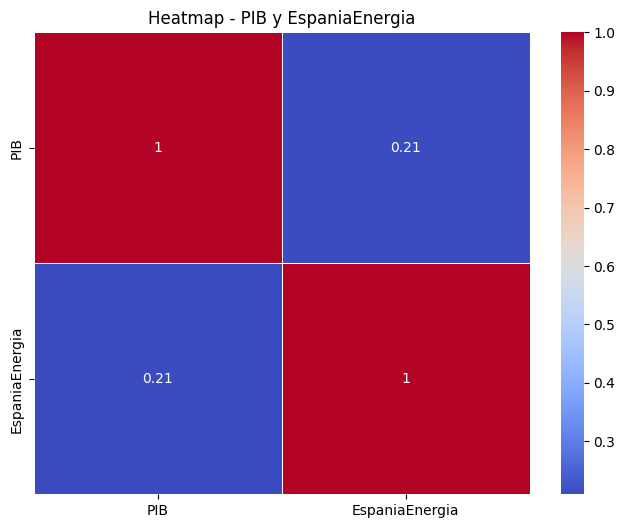

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear un DataFrame con solo las columnas PIB y EspaniaEnergia
df_heatmap = df_final[['PIB', 'EspaniaEnergia']].dropna()

# Calcular la correlación entre las dos columnas
correlacion = df_heatmap.corr()

# Crear el heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap - PIB y EspaniaEnergia')
plt.show()

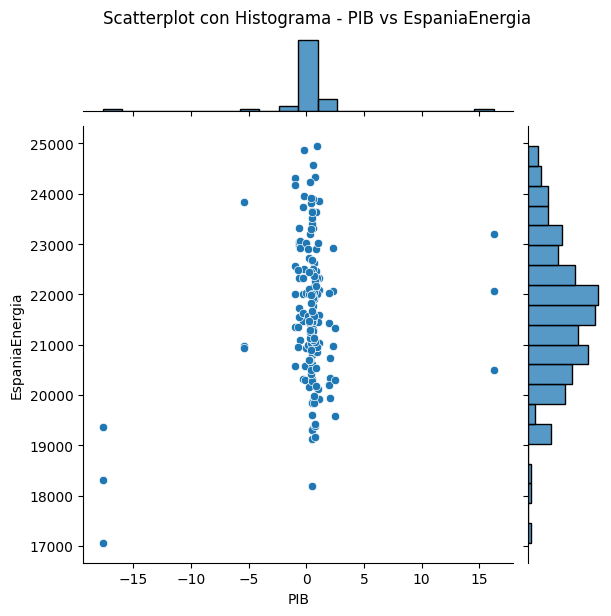

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear un DataFrame con solo las columnas PIB y EspaniaEnergia
df_scatter = df_final[['PIB', 'EspaniaEnergia']].dropna()

# Crear el scatterplot con histogramas
sns.jointplot(x='PIB', y='EspaniaEnergia', data=df_scatter, kind='scatter', marginal_kws=dict(bins=20, fill=True))

# Configurar el título
plt.suptitle('Scatterplot con Histograma - PIB vs EspaniaEnergia', y=1.02)

# Mostrar el gráfico
plt.show()

## Eliminación de columnas  con mucha correlación


### Eliminación columnas duración día

Dado que la mayoría de las columnas tienen una correlación muy alta entre sí, se decide dejar 3 columnas que tienen una correlación un poco más baja entre ellas y algo de correlación con la variable de respuesta.

Se decide conservar 3 columnas de duración día. Estas columnas son Valencia y Aragon porque son las que más correlación positiva tienen con la variable objetivo y además no tienen un acorrelación de 1 entre ellas. También se decide dejar Islas Baleares porque es la que tiene más correlación negativa con la variable objetivo y no tiene correlación de 1 con las otras dos variables seleccionadas.

In [ ]:
# se realiza una copia de df_final

df_sindia = df_final.copy()

In [ ]:
# Definir las comunidades cuyas columnas "DuracionDia" se deben conservar
comunidades_a_conservar = ['IslasBaleares', 'Aragon', 'Valencia']

# Eliminar todas las columnas que contienen "DuracionDia" excepto las de Catalunia, Aragon y Valencia
df_sindia = df_sindia.drop(columns=[col for col in df_sindia.columns
                                  if 'DuracionDia' in col and
                                  not any(comunidad in col for comunidad in comunidades_a_conservar)])




In [ ]:
# Mostrar las primeras filas del dataframe resultante
print(df_sindia.head())

        Fecha  AndaluciaEnergia  AragonEnergia  AsturiasEnergia  \
0  2011-01-01       3611.370158     956.500295      1020.147744   
14 2011-02-01       3206.557695     872.527978       920.399066   
28 2011-03-01       3363.760649     942.539985       986.152384   
42 2011-04-01       2902.823703     825.725543       881.845117   
56 2011-05-01       2988.726944     874.732192       910.096249   

    CantabriaEnergia  CastillaDeLaManchaEnergia  CastillaYLeonEnergia  \
0         394.458733                1151.079404           1308.023490   
14        366.574242                1039.329384           1189.416356   
28        402.782196                1092.285257           1264.476681   
42        361.935178                 895.004912           1039.440167   
56        379.054143                 942.660376           1106.830540   

    CataluniaEnergia  CeutaEnergia  EspaniaEnergia  ...  \
0        4342.582019     16.753994    24865.971404  ...   
14       3908.142365     15.248486    22

### Eliminación columnas de temperatura

de temperatura máxima se opta por eliminar Navarra dado que tiene más correlaciones de 1 que País Vasco. Y de temperatura mínima se opta por eliminar Pais Vasco dado que tiene correlación de 1 con Navarra y la Rioja

In [ ]:
# se realiza una copia de df_final

df_sincorr = df_sindia.copy()

In [ ]:
df_sincorr = df_sincorr.drop(columns=['NavarraTemperaturaMax', 'PaisVascoTemperaturaMin'])

In [ ]:
df_sincorr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 164 entries, 0 to 111
Data columns (total 62 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Fecha                             164 non-null    datetime64[ns]
 1   AndaluciaEnergia                  158 non-null    float64       
 2   AragonEnergia                     158 non-null    float64       
 3   AsturiasEnergia                   158 non-null    float64       
 4   CantabriaEnergia                  157 non-null    float64       
 5   CastillaDeLaManchaEnergia         157 non-null    float64       
 6   CastillaYLeonEnergia              157 non-null    float64       
 7   CataluniaEnergia                  158 non-null    float64       
 8   CeutaEnergia                      162 non-null    float64       
 9   EspaniaEnergia                    164 non-null    float64       
 10  ExtremaduraEnergia                157 non-null    float

## Generación de nuevas variables

In [ ]:
# Eliminar las filas en las que 'CantabriaEnergia' tiene NaNs
df_sincorr = df_sincorr.dropna(subset=['CantabriaEnergia'])

In [ ]:
df_sincorr.info()



<class 'pandas.core.frame.DataFrame'>
Index: 157 entries, 0 to 13
Data columns (total 62 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Fecha                             157 non-null    datetime64[ns]
 1   AndaluciaEnergia                  157 non-null    float64       
 2   AragonEnergia                     157 non-null    float64       
 3   AsturiasEnergia                   157 non-null    float64       
 4   CantabriaEnergia                  157 non-null    float64       
 5   CastillaDeLaManchaEnergia         157 non-null    float64       
 6   CastillaYLeonEnergia              157 non-null    float64       
 7   CataluniaEnergia                  157 non-null    float64       
 8   CeutaEnergia                      157 non-null    float64       
 9   EspaniaEnergia                    157 non-null    float64       
 10  ExtremaduraEnergia                157 non-null    float6

Análisis de autocorrelación de la demanda de energía

n el código de ejemplo que te proporcioné, el parámetro lags=24 se refiere a la cantidad de lags (retardos) que se mostrarán en el gráfico de autocorrelación (ACF) y autocorrelación parcial (PACF). La razón por la que se utiliza 24 es para cubrir dos años de datos mensuales, ya que estás trabajando con una serie temporal mensual.

Explicación:
lags=24 significa que el gráfico ACF/PACF mostrará la autocorrelación de la serie de tiempo hasta 24 lags (retardos) anteriores.
Como tus datos son mensuales, cada lag representa un mes anterior. Por lo tanto, un lag de 24 representa la demanda de energía hasta dos años atrás.
¿Por qué 24 lags?
Esto te permite ver cómo la demanda actual está correlacionada con la demanda de hasta dos años atrás. Puede ser útil para identificar patrones estacionales que se repiten de forma anual o bianual, por ejemplo, los picos de demanda en invierno o verano que mencionaste.
Si observas patrones estacionales anuales, como picos en invierno y verano, verás autocorrelaciones significativas en lags de 12 meses, 24 meses, etc. Por eso, es común comenzar con 24 lags para datos mensuales.

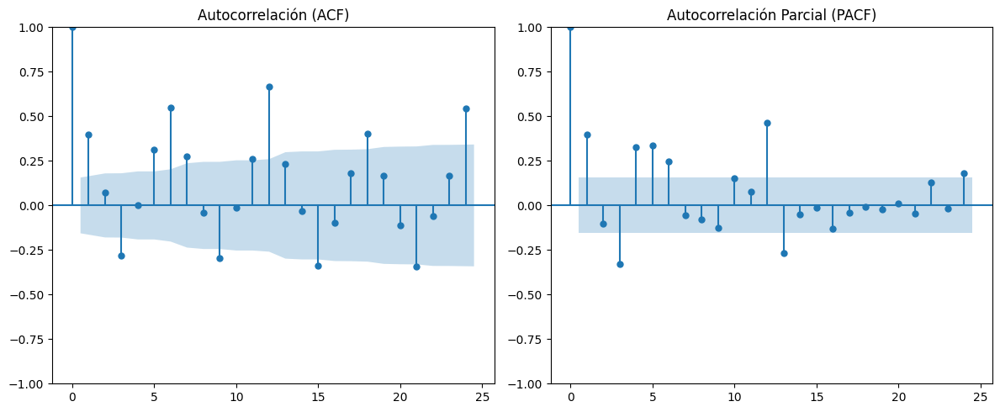

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Suponiendo que 'df_energia' tiene una columna 'EspaniaEnergia' con los datos de demanda
plt.figure(figsize=(12, 5))

# Gráfico de Autocorrelación (ACF)
plt.subplot(1, 2, 1)
plot_acf(df_sincorr['EspaniaEnergia'].dropna(), lags=24, ax=plt.gca())
plt.title('Autocorrelación (ACF)')

# Gráfico de Autocorrelación Parcial (PACF)
plt.subplot(1, 2, 2)
plot_pacf(df_sincorr['EspaniaEnergia'].dropna(), lags=24, ax=plt.gca())
plt.title('Autocorrelación Parcial (PACF)')

plt.tight_layout()
plt.show()

Gráfico de ACF (Autocorrelación):
Pico significativo en lag 1: El primer lag muestra una autocorrelación bastante alta, lo cual indica que la demanda de un mes tiene una fuerte relación con el mes inmediatamente anterior.
Patrones repetitivos o estacionales: Observamos algunos picos en lags de 12 y 24 (aproximadamente), lo cual podría sugerir la existencia de un componente estacional anual. Dado que mencionaste que existen picos en invierno y verano, esto puede reflejarse en estos lags.
Autocorrelación disminuye gradualmente: La ACF disminuye de manera lenta y presenta algunos picos más altos alrededor de lag 12, lo que refuerza la hipótesis de una estacionalidad anual.
Gráfico de PACF (Autocorrelación Parcial):
Picos significativos en lags bajos (1 a 4): La PACF muestra picos en los primeros lags (1, 2, y 3), lo cual indica que la demanda de un mes está directamente correlacionada con los valores de los meses más recientes. Esta información es útil para decidir cuántos lags incluir en tu modelo.
Lag 12 muestra una leve correlación: Aunque no es un pico muy prominente, el lag 12 también aparece en la PACF, lo que refuerza la posible estacionalidad anual.
¿Qué hacer con esta información?
Incluir lags de corto plazo: Con base en el PACF, sería recomendable incluir lags de 1, 2, y 3 meses, ya que tienen correlaciones parciales significativas.
Incluir lags estacionales: Dado que los gráficos muestran señales de estacionalidad, incluir un lag de 12 meses podría ser beneficioso para captar patrones anuales.
Considerar un enfoque estacional: El comportamiento en ambos gráficos sugiere que la serie tiene componentes estacionales, por lo que podrías considerar un modelo SARIMA o introducir términos de estacionalidad en tu enfoque actual.

Lags sugeridos:
Lags de corto plazo:

Lag 1, Lag 2, y Lag 3: La PACF mostró picos significativos en estos lags, lo que indica una fuerte relación entre la demanda de un mes y los meses anteriores inmediatos. Estos lags pueden ayudar a captar la inercia o el efecto de persistencia de la demanda de un mes al siguiente.
Lag estacional:

Lag 12: Los gráficos indican que hay estacionalidad anual, con una relación significativa entre la demanda de un mes y la del mismo mes en el año anterior. Este lag es crucial para capturar patrones estacionales en tu modelo.
Lags adicionales opcionales:

Si ves algún comportamiento estacional adicional que quieres capturar, podrías considerar agregar Lag 24 para ver el efecto de la demanda de dos años atrás, aunque con los datos actuales, los lags más críticos son los mencionados anteriormente.

Se considera crear más variables independientes con la serie diferenciada, pero no se lo hace debido a que se eliminarían más filas.

Dado que se ven patrones en elos datos se generan más datos de las fechas. Se agrega el mes al que corresponde cada dato y también si cada uno corresponde a invierno, verano, otoño o primavera

In [ ]:
df_sincorr['Mes'] = df_sincorr['Fecha'].dt.month

In [ ]:
def get_estacion(mes):
    if mes in [12, 1, 2]:
        return 'Invierno'
    elif mes in [3, 4, 5]:
        return 'Primavera'
    elif mes in [6, 7, 8]:
        return 'Verano'
    else:
        return 'Otoño'

df_sincorr['Estacion'] = df_sincorr['Mes'].apply(get_estacion)

In [ ]:
# se realiza One hot encoding
df_sincorr = pd.get_dummies(df_sincorr, columns=['Estacion'], drop_first=True)


en el libro s eencuentra algo de explicación de los promedios móviles en la página 96

La demanda media expanding se refiere a un promedio acumulativo que se calcula de tal forma que, para cada punto de la serie temporal, el promedio incluye todos los datos desde el inicio de la serie hasta el punto actual.

En términos técnicos, la media expanding se define como el promedio de todos los valores observados hasta un punto en particular en la serie temporal. La diferencia principal con una media móvil es que la media expanding no tiene una ventana fija; en cambio, su ventana se expande desde el primer valor de la serie hasta el punto actual.

Características de la media expanding:
Incluye todos los puntos anteriores: A medida que avanza en la serie temporal, el cálculo de la media expanding incluye todos los puntos anteriores, lo cual permite ver una tendencia general sin limitarse a una ventana fija.
Progresivamente más suave: Cuantos más datos se incluyen, la media expanding se vuelve más estable y menos sensible a variaciones puntuales

In [ ]:
# Crear promedios móviles usando diferentes ventanas
df_sincorr['Demanda_Media3'] = df_sincorr['EspaniaEnergia'].rolling(window=3, min_periods=1).mean()
df_sincorr['Demanda_Media6'] = df_sincorr['EspaniaEnergia'].rolling(window=6, min_periods=1).mean()
df_sincorr['Demanda_Media12'] = df_sincorr['EspaniaEnergia'].rolling(window=12, min_periods=1).mean()

# Crear una media acumulativa que expande a medida que avanzan los datos
df_sincorr['Demanda_Media_Expanding'] = df_sincorr['EspaniaEnergia'].expanding().mean()


In [ ]:
df_sincorr

,Fecha,AndaluciaEnergia,AragonEnergia,AsturiasEnergia,CantabriaEnergia,CastillaDeLaManchaEnergia,CastillaYLeonEnergia,CataluniaEnergia,CeutaEnergia,EspaniaEnergia,...,Poblacion,PIB,Mes,Estacion_Otoño,Estacion_Primavera,Estacion_Verano,Demanda_Media3,Demanda_Media6,Demanda_Media12,Demanda_Media_Expanding
0,2011-01-01,3611.370158,956.500295,1020.147744,394.458733,1151.079404,1308.023490,4342.582019,16.753994,24865.971404,...,1.555572e+07,-0.1500,1,False,False,False,24865.971404,24865.971404,24865.971404,24865.971404
14,2011-02-01,3206.557695,872.527978,920.399066,366.574242,1039.329384,1189.416356,3908.142365,15.248486,22494.540055,...,1.555572e+07,-0.1500,2,False,False,False,23680.255730,23680.255730,23680.255730,23680.255730
28,2011-03-01,3363.760649,942.539985,986.152384,402.782196,1092.285257,1264.476681,4218.751172,16.429358,23960.347443,...,1.555572e+07,-0.1500,3,False,True,False,23773.619634,23773.619634,23773.619634,23773.619634
42,2011-04-01,2902.823703,825.725543,881.845117,361.935178,895.004912,1039.440167,3592.544226,14.974756,20308.197362,...,1.555572e+07,-0.3105,4,False,True,False,22254.361620,22907.264066,22907.264066,22907.264066
56,2011-05-01,2988.726944,874.732192,910.096249,379.054143,942.660376,1106.830540,3886.563827,16.125928,21474.032006,...,1.555572e+07,-0.3105,5,False,True,False,21914.192270,22620.617654,22620.617654,22620.617654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124,2023-09-01,3006.602444,765.643217,664.492400,285.815691,881.309115,1002.483013,3617.954842,15.704710,19596.284758,...,1.612750e+07,0.5067,9,True,False,False,21318.556214,20183.617901,20244.209699,21733.135076
137,2023-10-01,3003.718883,767.601167,697.903882,296.378489,884.290549,1060.383098,3604.422609,15.703419,19833.832527,...,1.617401e+07,0.7148,10,True,False,False,20368.411309,20458.965735,20286.186317,21720.801943
150,2023-11-01,2981.726852,788.203623,707.637896,306.606421,942.604793,1126.147200,3546.276030,14.661887,19983.539977,...,1.617401e+07,0.7148,11,True,False,False,19804.552421,20603.394800,20343.000838,21709.593801
163,2023-12-01,3421.974695,790.003599,741.593527,276.812956,1043.730568,1153.652620,3665.698858,15.417852,21141.967169,...,1.617401e+07,0.7148,12,False,False,False,20319.779891,20819.168053,20414.193376,21705.955169


In [ ]:
df_sincorr.to_csv('df_sincorr.csv', index=False)

# Código para descargar el archivo en Colab
from google.colab import files
files.download('df_sincorr.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>